In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
sns.set_context('notebook', font_scale=1.5, rc={'lines.markeredgewidth': 2})

In [2]:
%load_ext autoreload
%autoreload 2

%matplotlib inline

In [3]:
import visual_behavior.data_access.utilities as utilities
from visual_behavior.data_access import loading as loading

import visual_behavior.visualization.utils as utils
import visual_behavior.visualization.ophys.platform_paper_figures as ppf

from allensdk.brain_observatory.behavior.behavior_project_cache import VisualBehaviorOphysProjectCache

In [4]:
import figrid as fg
import figrid.example_figures as example_figures

### load experiments table

In [5]:
cache_dir = loading.get_platform_analysis_cache_dir()
cache = VisualBehaviorOphysProjectCache.from_s3_cache(cache_dir=cache_dir)
# experiments_table = cache.get_ophys_experiments()
# print(cache_dir)

In [6]:
experiment_table = loading.get_platform_paper_experiment_table(limit_to_closest_active=True, 
                                                               add_extra_columns=True, 
                                                               include_4x2_data=False,
                                                               remove_Ai94=True,
                                                               remove_flagged=True)
print(len(experiment_table.mouse_id.unique()), 'mice')
print(len(experiment_table.ophys_container_id.unique()), 'containers')
print(len(experiment_table.index.unique()), 'experiments')

66 mice
134 containers
402 experiments


In [7]:
cells_table = loading.get_cell_table(platform_paper_only=True, 
                                     add_extra_columns=True, 
                                     limit_to_closest_active=True, 
                                     limit_to_matched_cells=False, 
                                     include_4x2_data=False, 
                                     remove_Ai94=True)
print(len(cells_table.mouse_id.unique()), 'mice')
print(len(cells_table.ophys_container_id.unique()), 'containers')
print(len(cells_table.ophys_experiment_id.unique()), 'experiments')
print(len(cells_table.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
402 experiments
14495 cells


In [8]:
experience_levels = utils.get_new_experience_levels()
cell_types = utils.get_cell_types()

In [9]:
cells = cells_table.copy()
cells['experience_level'] = [utils.convert_experience_level(experience) for experience in cells.experience_level.values]

In [10]:
# per genotype
tmp = cells.drop_duplicates(['cell_specimen_id'])
tmp.value_counts('full_genotype')

full_genotype
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GCaMP6f)/wt    12826
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt                1201
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt                 468
dtype: int64

In [11]:
cell_counts = cells.value_counts(subset=['cell_type', 'experience_level']).reset_index().rename(columns={0:'n_cells'})
cell_counts

,cell_type,experience_level,n_cells
0,Excitatory,Novel,7974
1,Excitatory,Novel +,7404
2,Excitatory,Familiar,7302
3,Vip Inhibitory,Familiar,794
4,Vip Inhibitory,Novel +,765
5,Vip Inhibitory,Novel,718
6,Sst Inhibitory,Novel,337
7,Sst Inhibitory,Familiar,321
8,Sst Inhibitory,Novel +,320


In [12]:
colors = utils.get_experience_level_colors()

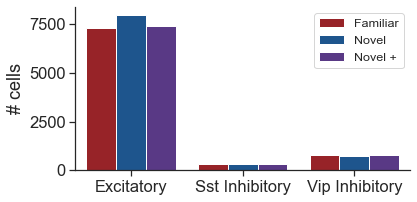

In [13]:
fig, ax = plt.subplots(figsize=(6,3))
# sns.pointplot(data=cell_counts, x='cell_type', y='n_cells', hue='experience_level', join=False, dodge=0.5, 
#             order=cell_types[::-1], hue_order=experience_levels, palette=colors, ax=ax)
sns.barplot(data=cell_counts, x='cell_type', y='n_cells', hue='experience_level', 
            order=cell_types, hue_order=experience_levels, palette=colors, ax=ax)
ax.set_xlabel('')
ax.set_ylabel('# cells')
ax.legend(fontsize='x-small')

### matched cells

In [14]:
matched_cells = loading.get_cell_table(platform_paper_only=True, 
                                     add_extra_columns=True, 
                                     limit_to_closest_active=True, 
                                     limit_to_matched_cells=True, 
                                     include_4x2_data=False, 
                                     remove_Ai94=True)
print(len(matched_cells.mouse_id.unique()), 'mice')
print(len(matched_cells.ophys_container_id.unique()), 'containers')
print(len(matched_cells.ophys_experiment_id.unique()), 'experiments')
print(len(matched_cells.cell_specimen_id.unique()), 'cells')

65 mice
131 containers
393 experiments
3921 cells


In [15]:
matched = matched_cells.copy()
matched['experience_level'] = [utils.convert_experience_level(experience) for experience in matched.experience_level.values]

In [16]:
matched_counts = matched.value_counts(subset=['cell_type', 'experience_level']).reset_index().rename(columns={0:'n_cells'})
matched_counts = matched_counts.drop(columns='experience_level')

In [17]:
matched_counts = matched_counts.drop_duplicates('cell_type')
matched_counts['experience_level'] = 'matched'

In [18]:
data = pd.concat([cell_counts, matched_counts])

In [19]:
data

,cell_type,experience_level,n_cells
0,Excitatory,Novel,7974
1,Excitatory,Novel +,7404
2,Excitatory,Familiar,7302
3,Vip Inhibitory,Familiar,794
4,Vip Inhibitory,Novel +,765
5,Vip Inhibitory,Novel,718
6,Sst Inhibitory,Novel,337
7,Sst Inhibitory,Familiar,321
8,Sst Inhibitory,Novel +,320
0,Excitatory,matched,3306


In [20]:
experience_levels+['matched']

['Familiar', 'Novel', 'Novel +', 'matched']

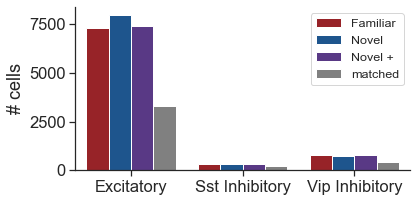

In [21]:
fig, ax = plt.subplots(figsize=(6,3))
# sns.pointplot(data=cell_counts, x='cell_type', y='n_cells', hue='experience_level', join=False, dodge=0.5, 
#             order=cell_types[::-1], hue_order=experience_levels, palette=colors, ax=ax)
sns.barplot(data=data, x='cell_type', y='n_cells', hue='experience_level', 
            order=cell_types, hue_order=experience_levels+['matched'], palette=colors+[(0.5, 0.5, 0.5)], ax=ax)
ax.set_xlabel('')
ax.set_ylabel('# cells')
ax.legend(fontsize='x-small')

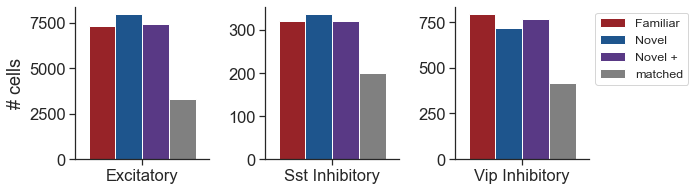

In [22]:
fig, ax = plt.subplots(1,3, figsize=(10,3))
# sns.pointplot(data=cell_counts, x='cell_type', y='n_cells', hue='experience_level', join=False, dodge=0.5, 
#             order=cell_types[::-1], hue_order=experience_levels, palette=colors, ax=ax)
for i, cell_type in enumerate(cell_types):
    ax[i] = sns.barplot(data=data[data.cell_type==cell_type], x='cell_type', y='n_cells', hue='experience_level', 
                hue_order=experience_levels+['matched'], palette=colors+[(0.5, 0.5, 0.5)], ax=ax[i])
    ax[i].set_xlabel('')
    ax[i].set_ylabel('')
    ax[i].get_legend().remove()
ax[0].set_ylabel('# cells')
ax[i].legend(fontsize='x-small', bbox_to_anchor=(1,1))
fig.tight_layout()

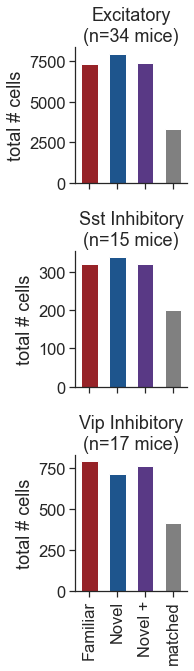

In [23]:
fig, ax = plt.subplots(3,1, figsize=(2, 10), sharex=True)
# sns.pointplot(data=cell_counts, x='cell_type', y='n_cells', hue='experience_level', join=False, dodge=0.5, 
#             order=cell_types[::-1], hue_order=experience_levels, palette=colors, ax=ax)
for i, cell_type in enumerate(cell_types):
    df = data[data.cell_type==cell_type]
    n_mice = len(experiment_table[experiment_table.cell_type==cell_type].mouse_id.unique())
    ax[i] = sns.barplot(data=df, x='experience_level', y='n_cells', order=experience_levels+['matched'],
                hue_order=experience_levels+['matched'], palette=colors+[(0.5, 0.5, 0.5)], width=0.6, ax=ax[i])
    ax[i].set_xlabel('')
#     ax[i].get_legend().remove()
    ax[i].set_ylabel('total # cells')
    ax[i].set_title(cell_type+'\n(n='+str(n_mice)+' mice)')
    ax[i].set_xticklabels(experience_levels+['matched'], rotation=90)
# ax[0].legend(fontsize='x-small', bbox_to_anchor=(1,1))
fig.subplots_adjust(hspace=0.5)

### n cells per container

In [24]:
cell_counts = cells.value_counts(subset=['cell_type', 'experience_level', 'ophys_container_id']).reset_index().rename(columns={0:'n_cells'})

matched_counts = matched.value_counts(subset=['cell_type', 'experience_level', 'ophys_container_id']).reset_index().rename(columns={0:'n_cells'})
matched_counts = matched_counts.drop(columns='experience_level')
# matched_counts = matched_counts.drop_duplicates('cell_type')
matched_counts['experience_level'] = 'matched'

container_matched = pd.concat([cell_counts, matched_counts])

C:\Users\marinag\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  
C:\Users\marinag\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  
C:\Users\marinag\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:8: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  


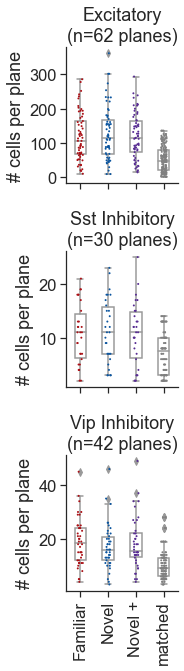

In [25]:
fig, ax = plt.subplots(3,1, figsize=(2,10), sharex=True)
ax = ax.ravel()
for i, cell_type in enumerate(cell_types): 
    df = container_matched[container_matched.cell_type==cell_type]
    n_containers = len(df.ophys_container_id.unique())
    ax[i] = sns.boxplot(data=df, x='experience_level', y='n_cells', order=experience_levels+['matched'], color='white', width=0.4, ax=ax[i])
    ax[i] = sns.stripplot(data=df, x='experience_level', y='n_cells', palette=colors+[(0.5, 0.5, 0.5)],
                          order=experience_levels+['matched'], s=2, ax=ax[i])
    ax[i].set_ylabel('# cells per plane')
#     ax[i].set_ylim(0,1)
    ax[i].set_xlabel('')
    ax[i].set_title(cell_type+'\n(n='+str(n_containers)+' planes)')
ax[i].set_xticklabels(experience_levels+['matched'], rotation=90)
fig.subplots_adjust(hspace=0.5)

### matched cells 

In [26]:
df_list = []
for cell_type in cell_types:
    ophys_container_ids = cells[cells.cell_type==cell_type].ophys_container_id.unique()
    for ophys_container_id in ophys_container_ids:
        container_cells = cells[cells.ophys_container_id==ophys_container_id]
        for experience_level1 in experience_levels:
            for experience_level2 in experience_levels:
#                 print(experience_level1, experience_level2)
                # get total cells between both sessions
                session_pair = container_cells[container_cells.experience_level.isin([experience_level1, experience_level2])]
#                 print(len(session_pair.ophys_experiment_id.unique()))
                total_cells = len(session_pair.cell_specimen_id.unique())
                # get # matched cells for this pair
                matched = session_pair.groupby(['cell_specimen_id']).count()[['ophys_experiment_id']]
                if experience_level1 == experience_level2: 
                    # if its the same session, only expect one expt id
                    matched = matched[matched.ophys_experiment_id==1]
                else: 
                    # otherwise find only the cells that are in 2 sessions (one for each exp level)
                    matched = matched[matched.ophys_experiment_id==2]
                matched_cells = len(matched)
                # compute fraction matched
                fraction_matched = matched_cells/total_cells
                # aggregate information
                df_list.append([cell_type, ophys_container_id, experience_level1, experience_level2,
                              total_cells, matched_cells, fraction_matched])

fraction_matched_df = pd.DataFrame(df_list, columns=['cell_type', 'ophys_container_id', 'experience_level1', 'experience_level2', 
                                    'total_cells', 'matched_cells', 'fraction_matched'])

In [27]:
fraction_matched_df.head()

,cell_type,ophys_container_id,experience_level1,experience_level2,total_cells,matched_cells,fraction_matched
0,Excitatory,814796612,Familiar,Familiar,199,199,1.000000
1,Excitatory,814796612,Familiar,Novel,273,147,0.538462
2,Excitatory,814796612,Familiar,Novel +,259,130,0.501931
3,Excitatory,814796612,Novel,Familiar,273,147,0.538462
4,Excitatory,814796612,Novel,Novel,221,221,1.000000


In [28]:
fraction_matched_df['pair'] = [fraction_matched_df.iloc[i].experience_level1+', '+fraction_matched_df.iloc[i].experience_level2 for i in range(len(fraction_matched_df))]

In [29]:
pairs = ['Familiar, Novel', 'Familiar, Novel +', 'Novel, Novel +']

matched_pairs = fraction_matched_df[fraction_matched_df.pair.isin(pairs)]

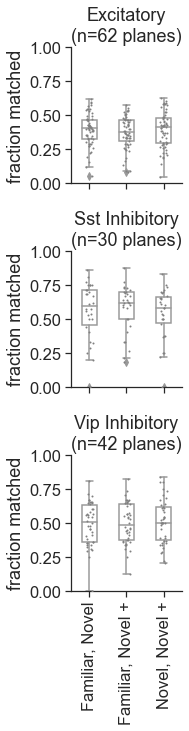

In [30]:
fig, ax = plt.subplots(3,1, figsize=(2,10), sharex=True)
ax = ax.ravel()
for i, cell_type in enumerate(cell_types): 
    df = matched_pairs[matched_pairs.cell_type==cell_type]
    n_containers = len(df.ophys_container_id.unique())
    ax[i] = sns.boxplot(data=df, x='pair', y='fraction_matched', order=pairs, color='white', width=0.4, ax=ax[i])
    ax[i] = sns.stripplot(data=df, x='pair', y='fraction_matched', order=pairs, s=2, color='gray', ax=ax[i])
    ax[i].set_ylabel('fraction matched')
    ax[i].set_ylim(0,1)
    ax[i].set_xlabel('')
    ax[i].set_title(cell_type+'\n(n='+str(n_containers)+' planes)')
ax[i].set_xticklabels(pairs, rotation=90)
# fig.tight_layout()
fig.subplots_adjust(hspace=0.5)

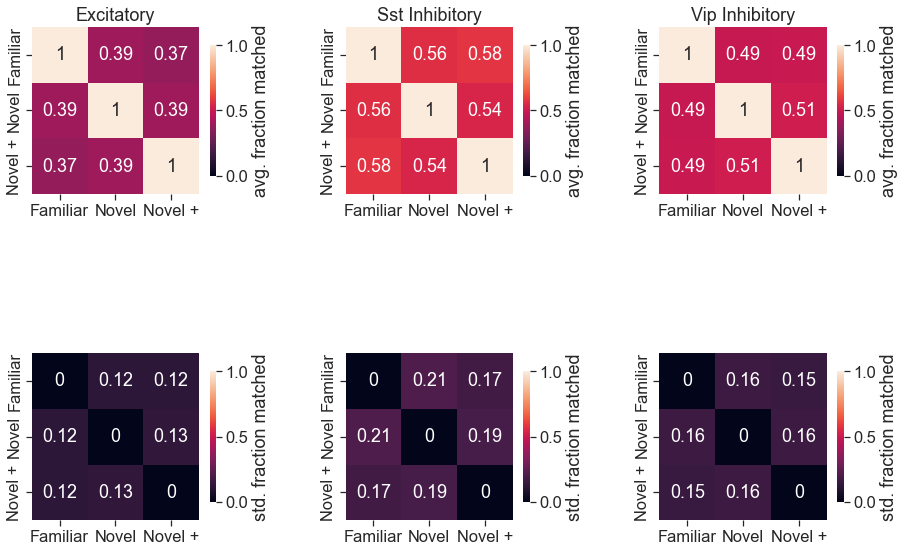

In [31]:
fig, ax = plt.subplots(2,3, figsize=(15,10))
ax = ax.ravel()
for i, cell_type in enumerate(cell_types): 
    df = fraction_matched_df[fraction_matched_df.cell_type==cell_type]
    # mean
    matrix = pd.pivot_table(data=df, index='experience_level1', columns=['experience_level2'], 
                        values='fraction_matched', aggfunc=np.mean)
    ax[i] = sns.heatmap(matrix, vmin=0, vmax=1, square=True, annot=True,
                     cbar_kws={'label':'avg. fraction matched', 'shrink':0.6}, ax=ax[i])
    ax[i].set_xlabel('')
    ax[i].set_ylabel('')
    ax[i].set_title(cell_type)
    
    # standard deviation
    matrix = pd.pivot_table(data=df, index='experience_level1', columns=['experience_level2'], 
                        values='fraction_matched', aggfunc=np.std)
    ax[i+3] = sns.heatmap(matrix, vmin=0, vmax=1, square=True, annot=True,
                     cbar_kws={'label':'std. fraction matched', 'shrink':0.6}, ax=ax[i+3])
    ax[i+3].set_xlabel('')
    ax[i+3].set_ylabel('')
#     ax[i].set_title(cell_type)

fig.subplots_adjust(hspace=0.5, wspace=0.5)

### get useful info

In [32]:
palette = utilities.get_experience_level_colors()

In [33]:
save_dir = r'\\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_plots\figure_2'

folder = 'population_averages'

### load multi_session_mean_df

In [34]:
data_type = 'events'

interpolate = True
output_sampling_rate = 30

# set inclusion criteria
# options: ['active_only', 'closest_familiar_and_novel', 'containers_with_all_levels']
inclusion_criteria = 'platform_experiment_table'

### change response multi_session_df

In [35]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

change_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

change_mdf = change_mdf[change_mdf.is_change==True]

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1249 experiments in the full multi_session_df
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


In [36]:
print(len(cells.mouse_id.unique()), 'mice')
print(len(cells.ophys_container_id.unique()), 'containers')
print(len(cells.ophys_experiment_id.unique()), 'experiments')
print(len(cells.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
402 experiments
14495 cells


In [37]:
print(len(change_mdf.mouse_id.unique()), 'mice')
print(len(change_mdf.ophys_container_id.unique()), 'containers')
print(len(change_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(change_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
402 experiments
14495 cells


### pre-change response multi_session_df

In [38]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'pre_change']


pre_change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

pre_change_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

pre_change_mdf = pre_change_mdf[pre_change_mdf.pre_change==True]

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1249 experiments in the full multi_session_df
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


### omission response multi_session_df

In [39]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted']


omission_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

omission_mdf = omission_mdf[omission_mdf.omitted==True]

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1249 experiments in the full multi_session_df
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table



### population averages

### changes

In [40]:
plt.rcParams['xtick.bottom'] = True
plt.rcParams['ytick.left'] = True

array([<AxesSubplot:title={'center':'Familiar'}, ylabel='population average'>,
       <AxesSubplot:title={'center':'Novel 1'}>,
       <AxesSubplot:title={'center':'Novel >1'}>,
       <AxesSubplot:ylabel='population average'>, <AxesSubplot:>,
       <AxesSubplot:>,
       <AxesSubplot:xlabel='time relative to change\n(seconds)', ylabel='population average'>,
       <AxesSubplot:xlabel='time relative to change\n(seconds)'>,
       <AxesSubplot:xlabel='time relative to change\n(seconds)'>],
      dtype=object)

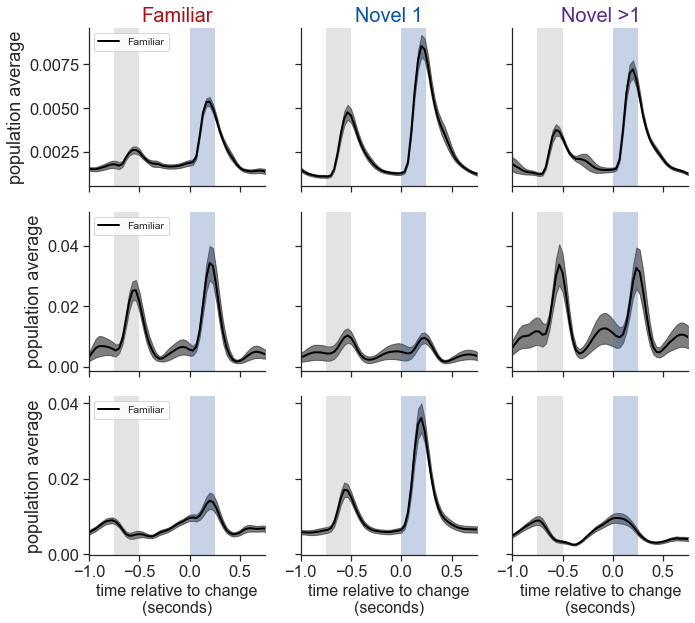

In [41]:
df = change_mdf.copy()

ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=[-1, 0.75], xlabel='time relative to change\n(seconds)', interval_sec=0.5,
                                                              data_type=data_type, event_type='changes', suffix=change_suffix,
                                                              save_dir=save_dir, folder=folder, ax=None)

### each project code 

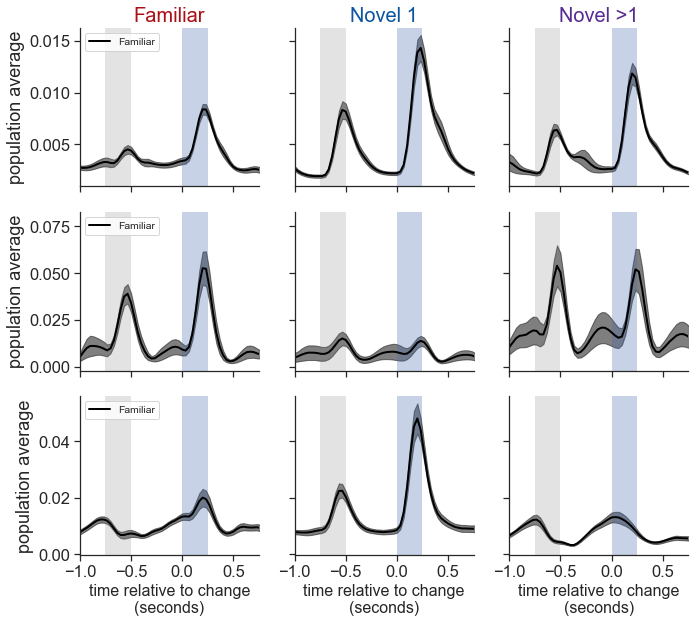

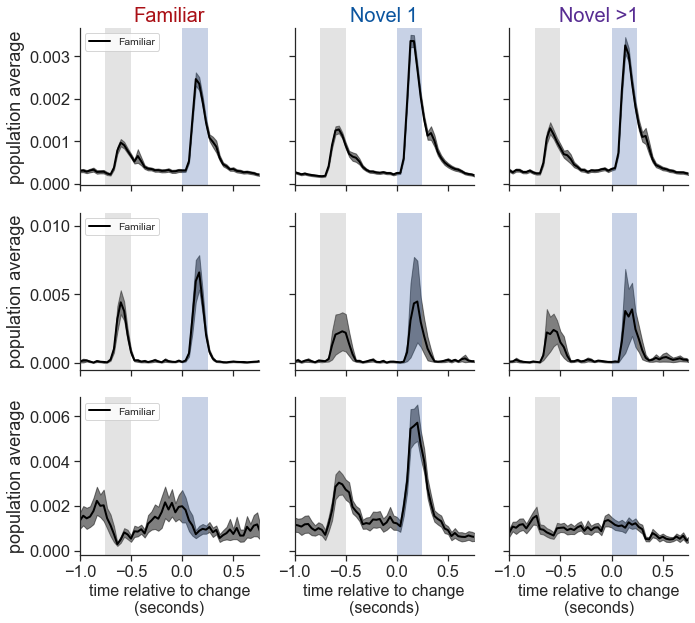

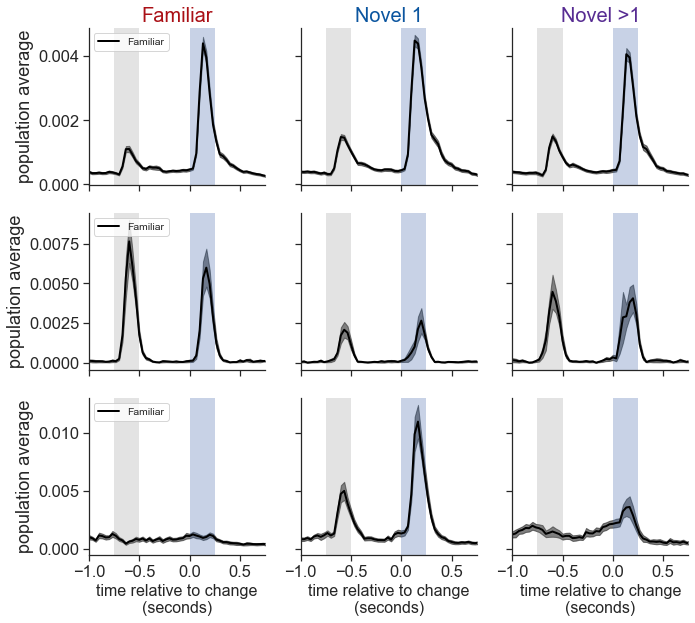

In [42]:
for project_code in change_mdf.project_code.unique():
    
    df = change_mdf[change_mdf.project_code==project_code]

    ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=[-1, 0.75], xlabel='time relative to change\n(seconds)', interval_sec=0.5,
                                                                  data_type=data_type, event_type='changes',
                                                                  suffix=change_suffix+'_'+project_code,
                                                                  save_dir=save_dir, folder=folder, ax=None)

### omissions

array([<AxesSubplot:title={'center':'Familiar'}, ylabel='population average'>,
       <AxesSubplot:title={'center':'Novel 1'}>,
       <AxesSubplot:title={'center':'Novel >1'}>,
       <AxesSubplot:ylabel='population average'>, <AxesSubplot:>,
       <AxesSubplot:>,
       <AxesSubplot:xlabel='time relative to omission\n(seconds)', ylabel='population average'>,
       <AxesSubplot:xlabel='time relative to omission\n(seconds)'>,
       <AxesSubplot:xlabel='time relative to omission\n(seconds)'>],
      dtype=object)

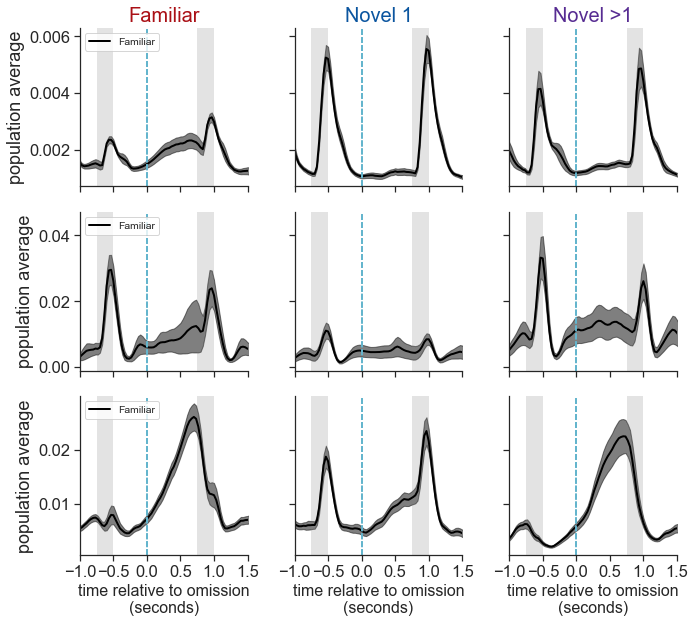

In [43]:
df = omission_mdf.copy()

ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=[-1., 1.5], xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
                                                              data_type=data_type, event_type='omissions', suffix=omission_suffix,
                                                              save_dir=save_dir, folder=folder, ax=None)

### each project code 

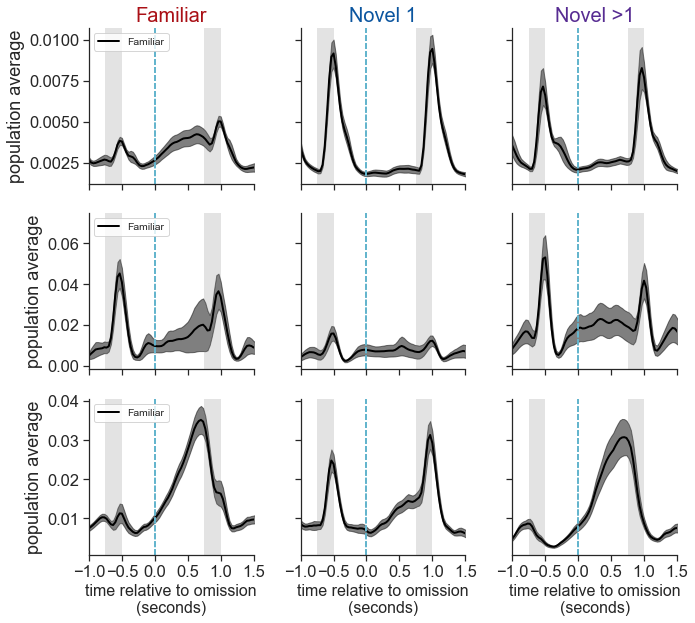

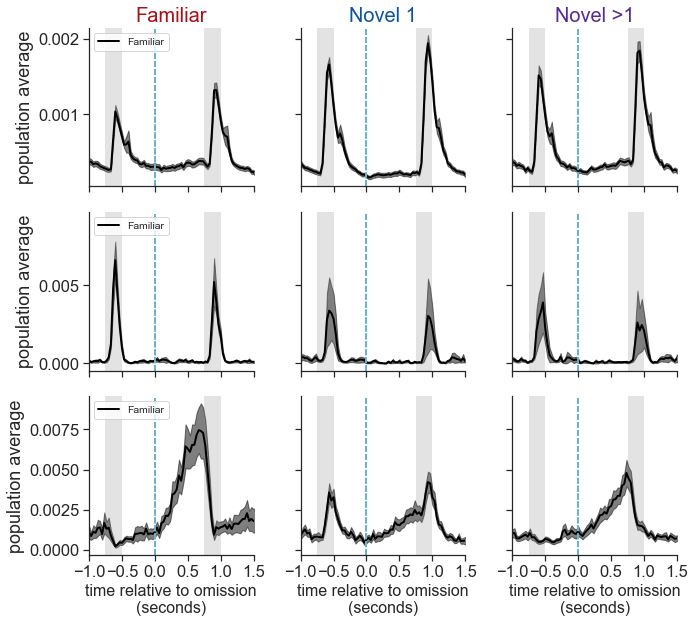

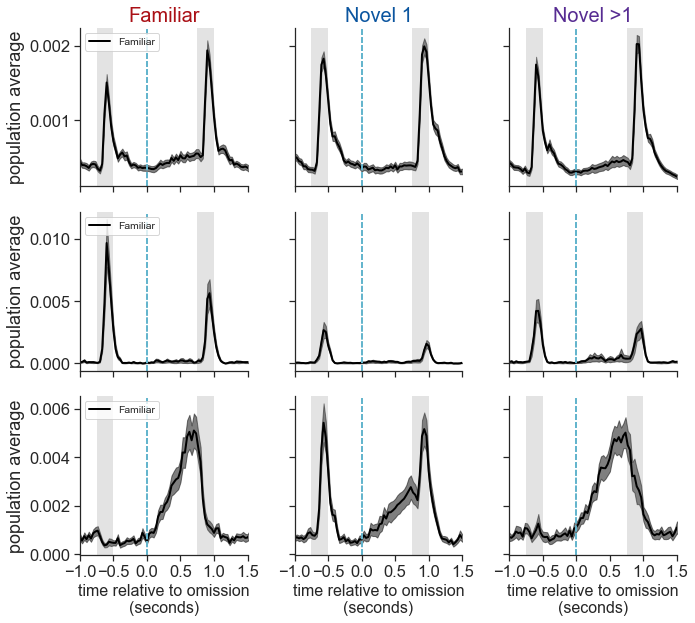

In [44]:
for project_code in omission_mdf.project_code.unique():
    
    df = omission_mdf[omission_mdf.project_code==project_code]
    
    ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=[-1., 1.5], xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
                                                              data_type=data_type, event_type='omissions', 
                                                              suffix=omission_suffix+'_'+project_code,
                                                              save_dir=save_dir, folder=folder, ax=None)

## single cell response heatmaps

array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Excitatory cells'>,
       <AxesSubplot:title={'center':'Novel 1'}>,
       <AxesSubplot:title={'center':'Novel >1'}>,
       <AxesSubplot:ylabel='Sst Inhibitory cells'>, <AxesSubplot:>,
       <AxesSubplot:>,
       <AxesSubplot:xlabel='Time after change (s)', ylabel='Vip Inhibitory cells'>,
       <AxesSubplot:xlabel='Time after change (s)'>,
       <AxesSubplot:xlabel='Time after change (s)'>], dtype=object)

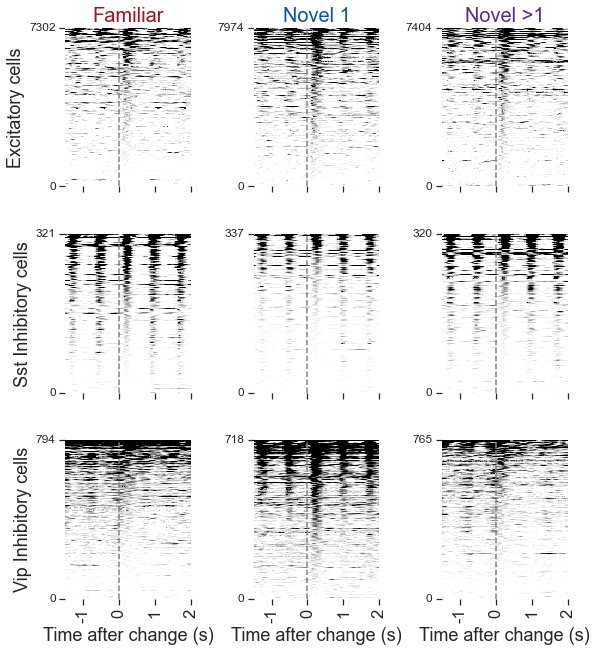

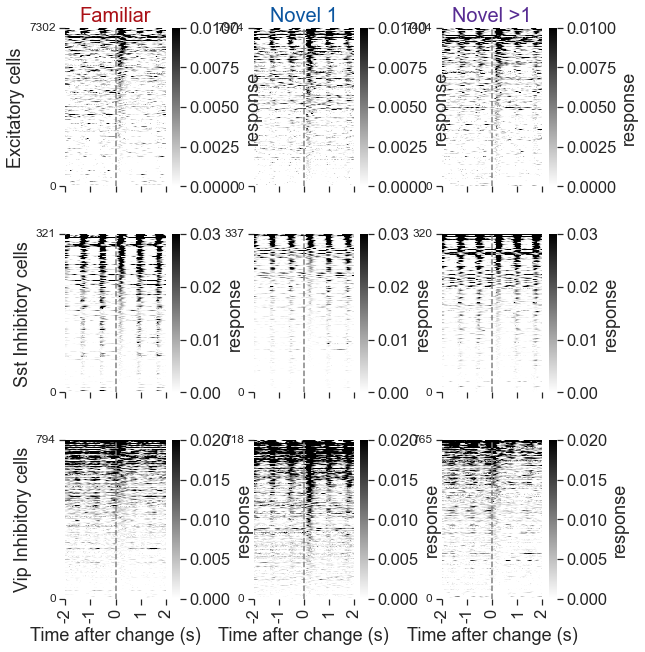

In [45]:
df = change_mdf.copy()
event_type = 'changes'

timestamps = df.trace_timestamps.values[0]
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
                                          row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
                                          microscope=None, vmax=None, xlim_seconds=[-1.5, 2], match_cells=False, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='', ax=None)


ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
                                          row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
                                          microscope=None, vmax=None, xlim_seconds=[-2, 2], match_cells=False, cbar=True,
                                          save_dir=save_dir, folder=folder, suffix='_cbar', ax=None)

array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Excitatory cells'>,
       <AxesSubplot:title={'center':'Novel 1'}>,
       <AxesSubplot:title={'center':'Novel >1'}>,
       <AxesSubplot:ylabel='Sst Inhibitory cells'>, <AxesSubplot:>,
       <AxesSubplot:>,
       <AxesSubplot:xlabel='Time after change (s)', ylabel='Vip Inhibitory cells'>,
       <AxesSubplot:xlabel='Time after change (s)'>,
       <AxesSubplot:xlabel='Time after change (s)'>], dtype=object)

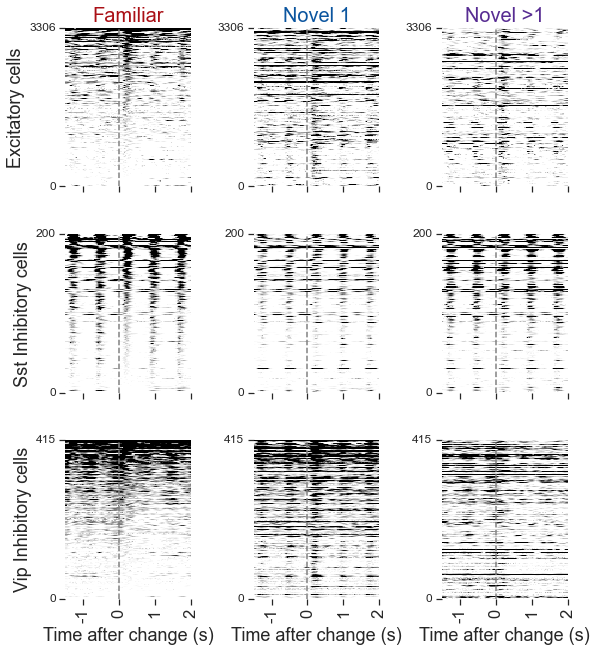

In [46]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(change_mdf)

ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'changes',
                                          row_condition, col_condition, cols_to_sort_by=None, suptitle='',
                                          microscope=None, vmax=None, xlim_seconds=[-1.5, 2], match_cells=True, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='_matched', ax=None)


array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Excitatory cells'>,
       <AxesSubplot:title={'center':'Novel 1'}>,
       <AxesSubplot:title={'center':'Novel >1'}>,
       <AxesSubplot:ylabel='Sst Inhibitory cells'>, <AxesSubplot:>,
       <AxesSubplot:>,
       <AxesSubplot:xlabel='Time after omission (s)', ylabel='Vip Inhibitory cells'>,
       <AxesSubplot:xlabel='Time after omission (s)'>,
       <AxesSubplot:xlabel='Time after omission (s)'>], dtype=object)

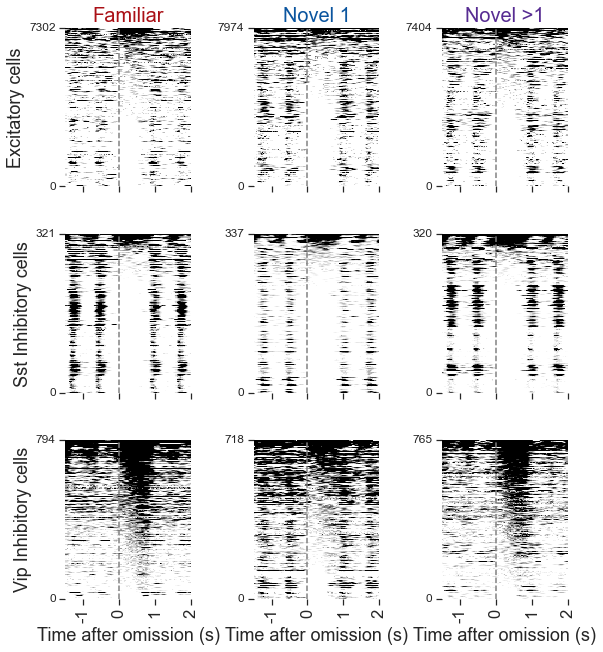

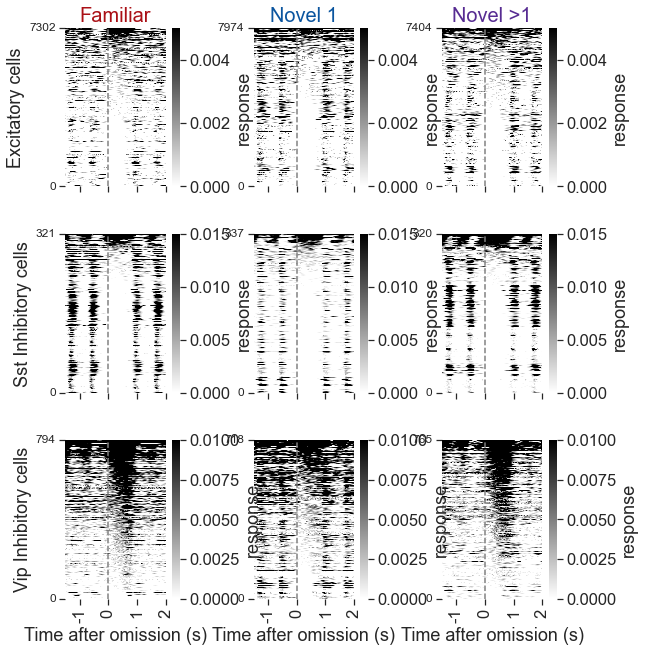

In [47]:
df = omission_mdf.copy()
event_type = 'omissions'

timestamps = df.trace_timestamps.values[0]
row_condition = 'cell_type'
col_condition = 'experience_level'
cols_to_sort_by = ['mean_response']

ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
                                          row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
                                          microscope=None, vmax=None, xlim_seconds=[-1.5, 2], match_cells=False, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='', ax=None)


ppf.plot_response_heatmaps_for_conditions(df, timestamps, data_type, event_type,
                                          row_condition, col_condition, cols_to_sort_by=cols_to_sort_by, suptitle='',
                                          microscope=None, vmax=None, xlim_seconds=[-1.5, 2], match_cells=False, cbar=True,
                                          save_dir=save_dir, folder=folder, suffix='_cbar', ax=None)

array([<AxesSubplot:title={'center':'Familiar'}, ylabel='Excitatory cells'>,
       <AxesSubplot:title={'center':'Novel 1'}>,
       <AxesSubplot:title={'center':'Novel >1'}>,
       <AxesSubplot:ylabel='Sst Inhibitory cells'>, <AxesSubplot:>,
       <AxesSubplot:>,
       <AxesSubplot:xlabel='Time after omission (s)', ylabel='Vip Inhibitory cells'>,
       <AxesSubplot:xlabel='Time after omission (s)'>,
       <AxesSubplot:xlabel='Time after omission (s)'>], dtype=object)

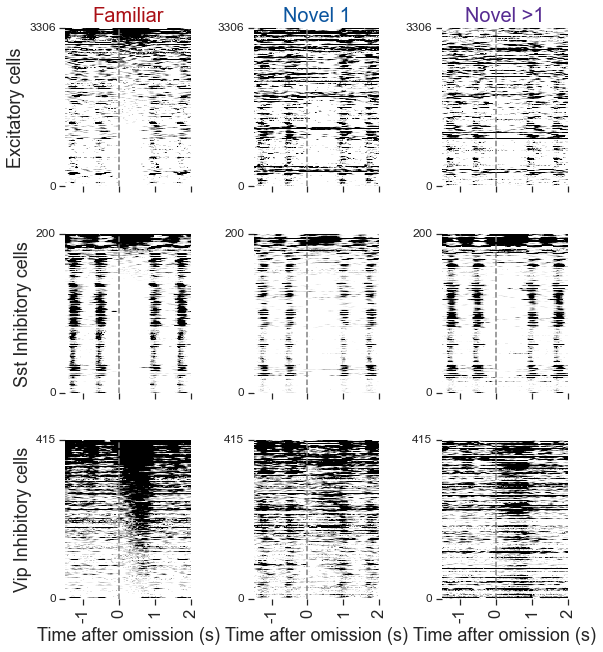

In [48]:
matched = utilities.limit_to_cell_specimen_ids_matched_in_all_experience_levels(omission_mdf)

ppf.plot_response_heatmaps_for_conditions(matched, timestamps, data_type, 'omissions',
                                          row_condition, col_condition, cols_to_sort_by=None, suptitle='',
                                          microscope=None, vmax=None, xlim_seconds=[-1.5, 2], match_cells=True, cbar=False,
                                          save_dir=save_dir, folder=folder, suffix='_matched', ax=None)


### population averages overlaid for dF/F

In [49]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

change_mdf_dff = loading.get_multi_session_df_for_conditions('dff', event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

change_mdf_dff = change_mdf_dff[change_mdf_dff.is_change==True]

change_mdf_dff['experience_level'] = [utils.convert_experience_level(exp) for exp in change_mdf_dff.experience_level.values]

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1249 experiments in the full multi_session_df
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


402


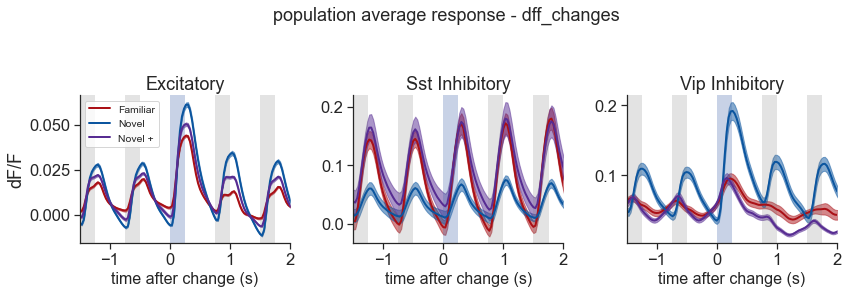

In [50]:
df = change_mdf_dff.copy()
print(len(df.ophys_experiment_id.unique()))
# df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-1, 0.75]
xlim_seconds = [-1.5, 2]

suffix = '_changes_overlay_dff'

ax = ppf.plot_population_averages_for_conditions(df, 'dff', 'changes',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


In [51]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted']


change_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

omission_mdf_dff = loading.get_multi_session_df_for_conditions('dff', event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

omission_mdf_dff = omission_mdf_dff[omission_mdf_dff.omitted==True]

omission_mdf_dff['experience_level'] = [utils.convert_experience_level(exp) for exp in omission_mdf_dff.experience_level.values]

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1249 experiments in the full multi_session_df
there are 402 experiments in the multi_session_df after limiting to platform experiments
there are 402 experiments after filtering for inclusion criteria -  platform_experiment_table


402


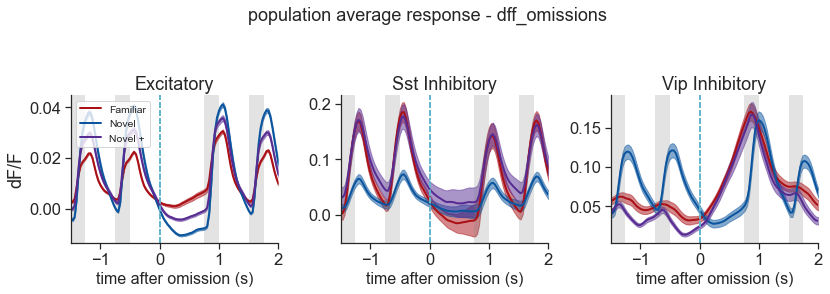

In [52]:
df = omission_mdf_dff.copy()
print(len(df.ophys_experiment_id.unique()))
# df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds = [-1.5, 2]

suffix = '_omissions_overlay_dff'

ax = ppf.plot_population_averages_for_conditions(df, 'dff', 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


## pop avg overlay for events

### changes

In [53]:
# change_mdf['experience_level'] = [utils.convert_experience_level(exp) for exp in change_mdf.experience_level.values]


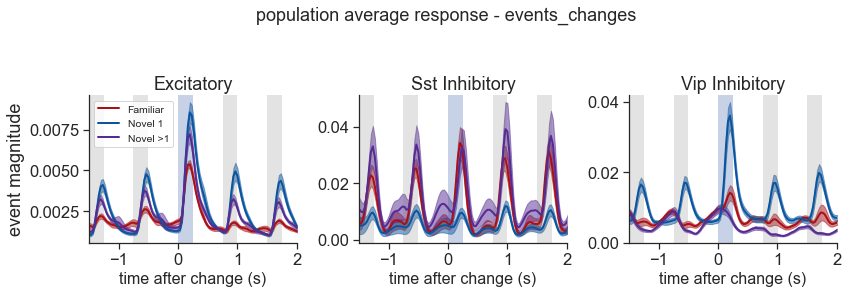

In [54]:
df = change_mdf.copy()

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
# xlim_seconds=[-1, 0.75]
xlim_seconds = [-1.5, 2]

suffix = '_changes_overlay_events'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


In [55]:
# # per project code
# for project_code in change_mdf.project_code.unique():
#     df = change_mdf[change_mdf.project_code==project_code]

#     axes_column = 'cell_type'
#     hue_column = 'experience_level'
#     palette = utils.get_experience_level_colors()
#     # xlim_seconds=[-1., 1.5]
#     xlim_seconds=[-1, 0.75]
##     xlim_seconds = [-1.5, 2]


#     suffix = '_changes_overlay_'+project_code

#     ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes',
#                                                             axes_column, hue_column, horizontal=True,
#                                                             xlim_seconds=xlim_seconds, interval_sec=0.5,
#                                                             palette=palette, ax=None, title=None, suptitle=None,
#                                                             save_dir=save_dir, folder=folder, suffix=suffix)


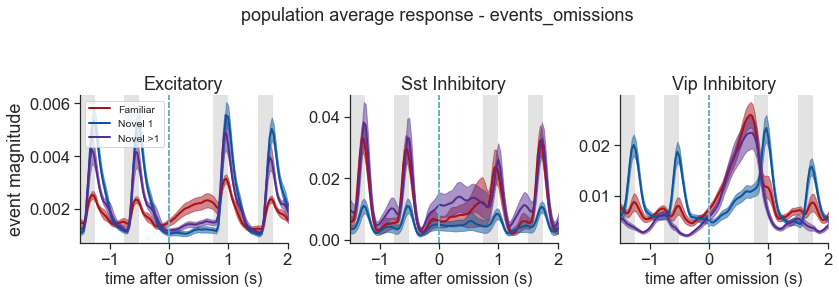

In [56]:
df = omission_mdf.copy()

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
# xlim_seconds=[-1, 0.75]
xlim_seconds = [-1.5, 2]

suffix = '_omissions_overlay_events'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=1,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)

In [57]:
# for project_code in change_mdf.project_code.unique():
#     df = omission_mdf[omission_mdf.project_code==project_code]

#     axes_column = 'cell_type'
#     hue_column = 'experience_level'
#     palette = utils.get_experience_level_colors()
#     xlim_seconds=[-1., 1.5]
#     # xlim_seconds=[-1, 0.75]

#     suffix = '_omissions_overlay_'+project_code

#     ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions',
#                                                             axes_column, hue_column, horizontal=True,
#                                                             xlim_seconds=xlim_seconds, interval_sec=0.5,
#                                                             palette=palette, ax=None, title=None, suptitle=None,
#                                                             save_dir=save_dir, folder=folder, suffix=suffix)


### population averages for active/passive

In [58]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'omitted']

inclusion_criteria = 'None'

passive_omission_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.omitted==True]

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1249 experiments in the full multi_session_df
there are 1248 experiments after filtering for inclusion criteria -  None


### limit to containers in the main platform study

In [59]:
platform_containers = experiment_table.ophys_container_id.unique()
print(len(platform_containers))

passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.ophys_container_id.isin(platform_containers)]

134


In [60]:
passive_expts = passive_omission_mdf.copy()
# limit to passive sessions, but keep the first novel session to count against
passive_expts = passive_expts[(passive_expts.passive==True)|(passive_expts.experience_level=='Novel 1')].copy()
# add column indicating session number relative to first novel session
passive_expts = utilities.add_n_relative_to_first_novel_column(passive_expts)
# identify the familiar session prior to novel session that is passive
passive_expts = utilities.add_last_familiar_column(passive_expts)
# identify the second novel session that is passive
passive_expts = utilities.add_second_novel_column(passive_expts)

In [61]:
conditions_to_group=['full_genotype', 'passive', 'second_novel', 'last_familiar']

utilities.count_mice_expts_containers_cells(passive_expts, conditions_to_group, include_matched_cells=False)

n_mouse_id  \
full_genotype                                      passive second_novel last_familiar               
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                  34   
                                                   True    False        False                  34   
                                                                        True                   28   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                  15   
                                                   True    False        False                  15   
                                                                        True                   14   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                  17   
                                                   True    False        False                  17   
                                                                        True                   14   

                                                                                       n_ophys_session_id  \
full_genotype                                      passive second_novel last_familiar                       
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                          34   
                                                   True    False        False                          67   
                                                                        True                           28   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                          15   
                                                   True    False        False                          30   
                                                                        True                           14   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                          17   
                                                   True    False        False                          32   
                                                                        True                           14   

                                                                                       n_ophys_experiment_id  \
full_genotype                                      passive second_novel last_familiar                          
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                             62   
                                                   True    False        False                            114   
                                                                        True                              55   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                             30   
                                                   True    False        False                             50   
                                                                        True                              21   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False   False        False                             42   
                                                   True    False        False                             70   
                                                                        True                              36   

                                                                                       n_ophys_container_id  \
full_genotype                                      passive second_novel last_familiar                         
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False   False        False                            62   
                                                   True    False        False                            62   
                                                                        True                      

In [62]:
# limit to closest familiar and novel passive sessions to the first novel session
passive_expts = passive_expts[(passive_expts.last_familiar==True)|(passive_expts.second_novel==True)].copy()

In [63]:
conditions_to_group=['full_genotype', 'passive', 'second_novel', 'last_familiar']

utilities.count_mice_expts_containers_cells(passive_expts, conditions_to_group, include_matched_cells=False)

,,,,n_mouse_id,n_ophys_session_id,n_ophys_experiment_id,n_ophys_container_id,n_cell_specimen_id
full_genotype,passive,second_novel,last_familiar,,,,,
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GCaMP6f)/wt,True,False,True,28,28,55,55,55
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,True,False,True,14,14,21,21,21
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt,True,False,True,14,14,36,36,36


In [64]:
passive_omission_mdf.passive.unique()

array([False, True], dtype=object)

In [65]:
print(len(passive_omission_mdf.mouse_id.unique()))
print(len(passive_omission_mdf.ophys_experiment_id.unique()))

66
854


In [66]:
print(len(passive_omission_mdf.mouse_id.unique()), 'mice')
print(len(passive_omission_mdf.ophys_container_id.unique()), 'containers')
print(len(passive_omission_mdf.ophys_experiment_id.unique()), 'experiments')
print(len(passive_omission_mdf.cell_specimen_id.unique()), 'cells')

66 mice
134 containers
854 experiments
19874 cells


In [67]:
conditions_to_group=['full_genotype', 'passive']

utilities.count_mice_expts_containers_cells(passive_omission_mdf, conditions_to_group, include_matched_cells=False)

n_mouse_id  \
full_genotype                                      passive               
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False            34   
                                                   True             34   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False            15   
                                                   True             15   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False            17   
                                                   True             17   

                                                            n_ophys_session_id  \
full_genotype                                      passive                       
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                   157   
                                                   True                     67   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                    74   
                                                   True                     30   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                    86   
                                                   True                     32   

                                                            n_ophys_experiment_id  \
full_genotype                                      passive                          
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                      277   
                                                   True                       114   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      144   
                                                   True                        50   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      199   
                                                   True                        70   

                                                            n_ophys_container_id  \
full_genotype                                      passive                         
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                      62   
                                                   True                       62   
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      30   
                                                   True                       30   
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                      42   
                                                   True                       42   

                                                            n_cell_specimen_id  
full_genotype                                      passive                      
Slc17a7-IRES2-Cre/wt;Camk2a-tTA/wt;Ai93(TITL-GC... False                 15305  
                                                   True                  10291  
Sst-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                   562  
                                                   True                    403  
Vip-IRES-Cre/wt;Ai148(TIT2L-GC6f-ICL-tTA2)/wt      False                  1429  
                                                   True                    876

In [68]:
# # limit to mice in platform expts
# passive_omission_mdf.mouse_id = [int(mouse_id) for mouse_id in passive_omission_mdf.mouse_id.values]

# passive_omission_mdf = passive_omission_mdf[passive_omission_mdf.mouse_id.isin(platform_expts.mouse_id.unique())]
# print(len(passive_omission_mdf.mouse_id.unique()))

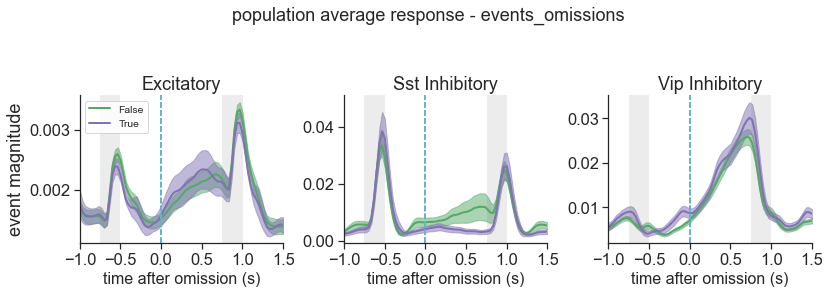

In [69]:
df = passive_omission_mdf.copy()
df = df[df.experience_level=='Familiar']

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)


In [70]:
# params for stim response df creation
event_type = 'all'

# params for mean response df creation
conditions = ['cell_specimen_id', 'is_change']

passive_change_mdf = loading.get_multi_session_df_for_conditions(data_type, event_type, conditions, 'containers_with_all_levels', 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

passive_change_mdf = passive_change_mdf[passive_change_mdf.is_change==True]

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1249 experiments in the full multi_session_df
there are 955 experiments after filtering for inclusion criteria -  containers_with_all_levels


In [71]:
# limit to mice in platform expts
passive_change_mdf.mouse_id = [int(mouse_id) for mouse_id in passive_change_mdf.mouse_id.values]

passive_change_mdf = passive_change_mdf[passive_change_mdf.mouse_id.isin(experiment_table.mouse_id.unique())]
print(len(passive_change_mdf.mouse_id.unique()))

66


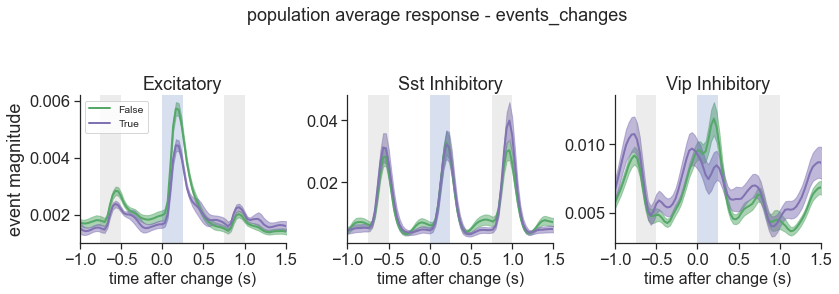

In [72]:
df = passive_change_mdf.copy()
df = df[df.experience_level=='Familiar']

axes_column = 'cell_type'
hue_column = 'passive'
palette = [sns.color_palette()[2], sns.color_palette()[4]]
xlim_seconds=[-1., 1.5]

# figsize = (10, 3)
# fig, ax = plt.subplots(1, 3, figsize=figsize)
# ax = ax.ravel()

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None)

### get multiscope expts matched to scientifica conditions

In [73]:
conditions_to_group=['project_code','cell_type', 'targeted_structure', 'binned_depth']

utilities.count_mice_expts_containers_cells(cells_table, conditions_to_group)

n_mouse_id  \
project_code             cell_type      targeted_structure binned_depth               
VisualBehavior           Excitatory     VISp               175                    6   
                                                           375                    7   
                         Sst Inhibitory VISp               275                    6   
                         Vip Inhibitory VISp               175                    6   
VisualBehaviorMultiscope Excitatory     VISl               75                     4   
                                                           175                    4   
                                                           275                    7   
                                                           375                    2   
                                        VISp               75                     3   
                                                           175                    3   
                                                           275                    7   
                                                           375                    6   
                         Sst Inhibitory VISl               175                    1   
                                                           275                    4   
                                        VISp               75                     3   
                                                           175                    3   
                                                           275                    3   
                                                           375                    3   
                         Vip Inhibitory VISl               75                     2   
                                                           175                    4   
                                                           275                    5   
                                                           375                    2   
                                        VISp               75                     6   
                                                           175                    3   
                                                           275                    5   
                                                           375                    1   
VisualBehaviorTask1B     Excitatory     VISp               175                    7   
                                                           375                    6   
                         Sst Inhibitory VISp               275                    4   
                         Vip Inhibitory VISp               175                    5   

                                                                         n_ophys_session_id  \
project_code             cell_type      targeted_structure binned_depth                       
VisualBehavior           Excitatory     VISp               175                           18   
                                                           375                           21   
                         Sst Inhibitory VISp               275                           18   
                         Vip Inhibitory VISp               175                           18   
VisualBehaviorMultiscope Excitatory     VISl               75                            12   
                                                           175                           12   
                                                           275                           21   
                                                           375                            6   
                                        VISp               75                             9   
                                                           175                            9   
                                                           275                           21   
                                                     

In [74]:
# get VB data
vb = cells_table[cells_table.project_code=='VisualBehavior']

# limit to multiscope
ms = cells_table[cells_table.project_code=='VisualBehaviorMultiscope']
# limit to V1 and remove 75um because its not in Scientifica
ms = ms[(ms.targeted_structure=='VISp')]
ms = ms[(ms.binned_depth!='75')]
print(len(ms))
# get expts for each cre line for the same depths that scientifica had
expt_ids = []
for cell_type in ms.cell_type.unique():
    expt_ids = np.hstack((expt_ids, ms[(ms.cell_type==cell_type)&(ms.binned_depth.isin(vb[vb.cell_type==cell_type].binned_depth.unique()))].ophys_experiment_id.unique()))

    # limit ms to expts that match the cell types & depths of vb
ms = ms[ms.ophys_experiment_id.isin(expt_ids)]

8509


In [75]:
conditions_to_group=['project_code','cell_type', 'targeted_structure', 'binned_depth']

utilities.count_mice_expts_containers_cells(ms, conditions_to_group)

n_mouse_id  \
project_code             cell_type      targeted_structure binned_depth               
VisualBehaviorMultiscope Excitatory     VISp               175                    3   
                                                           375                    6   
                         Sst Inhibitory VISp               275                    3   
                         Vip Inhibitory VISp               175                    3   

                                                                         n_ophys_session_id  \
project_code             cell_type      targeted_structure binned_depth                       
VisualBehaviorMultiscope Excitatory     VISp               175                            9   
                                                           375                           18   
                         Sst Inhibitory VISp               275                           10   
                         Vip Inhibitory VISp               175                            9   

                                                                         n_ophys_experiment_id  \
project_code             cell_type      targeted_structure binned_depth                          
VisualBehaviorMultiscope Excitatory     VISp               175                               9   
                                                           375                              18   
                         Sst Inhibitory VISp               275                              12   
                         Vip Inhibitory VISp               175                               9   

                                                                         n_ophys_container_id  \
project_code             cell_type      targeted_structure binned_depth                         
VisualBehaviorMultiscope Excitatory     VISp               175                              3   
                                                           375                              6   
                         Sst Inhibitory VISp               275                              4   
                         Vip Inhibitory VISp               175                              3   

                                                                         n_cell_specimen_id  \
project_code             cell_type      targeted_structure binned_depth                       
VisualBehaviorMultiscope Excitatory     VISp               175                          732   
                                                           375                          655   
                         Sst Inhibitory VISp               275                           55   
                         Vip Inhibitory VISp               175                          108   

                                                                         n_matched_cells  
project_code             cell_type      targeted_structure binned_depth                   
VisualBehaviorMultiscope Excitatory     VISp               175                       257  
                                                           375                       136  
                         Sst Inhibitory VISp               275                        24  
                         Vip Inhibitory VISp               175                        37

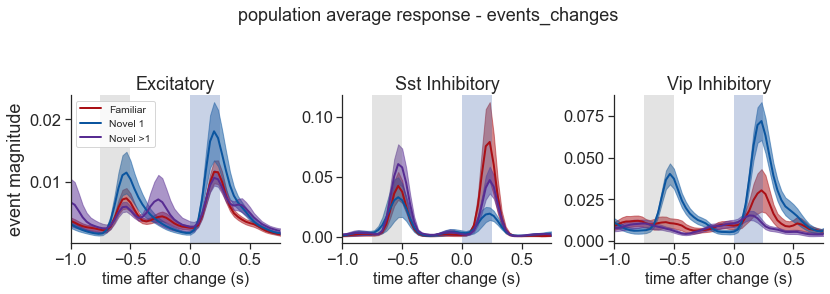

In [76]:
project_code = 'VisualBehaviorMultiscope'
df = change_mdf[change_mdf.ophys_experiment_id.isin(expt_ids)]
# df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
xlim_seconds=[-1, 0.75]

suffix = '_changes_overlay_'+project_code+'_matched_to_Scientifica'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'changes',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


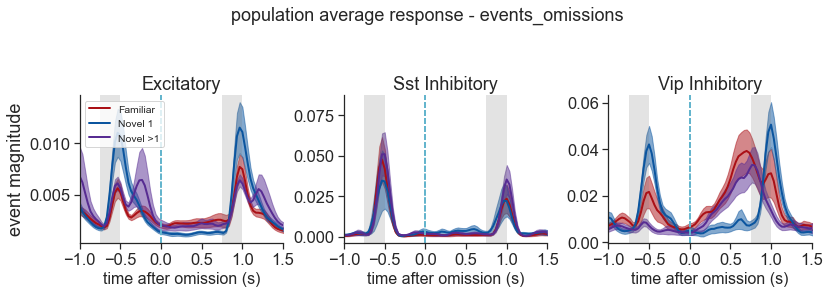

In [77]:
project_code = 'VisualBehaviorMultiscope'
df = omission_mdf[omission_mdf.ophys_experiment_id.isin(expt_ids)]

# df = change_mdf[change_mdf.project_code!='VisualBehaviortask1B']

axes_column = 'cell_type'
hue_column = 'experience_level'
palette = utils.get_experience_level_colors()
xlim_seconds=[-1., 1.5]
# xlim_seconds=[-1, 0.75]

suffix = '_omissions_overlay_'+project_code+'_matched_to_Scientifica'

ax = ppf.plot_population_averages_for_conditions(df, data_type, 'omissions',
                                                        axes_column, hue_column, horizontal=True,
                                                        xlim_seconds=xlim_seconds, interval_sec=0.5,
                                                        palette=palette, ax=None, title=None, suptitle=None,
                                                        save_dir=save_dir, folder=folder, suffix=suffix)


In [78]:
for cell_type in cells_table.cell_type.unique():
    print(len(cells_table[(cells_table.cell_type==cell_type)].cell_specimen_id.unique()))


12826
1201
468


### fraction responsive cells

### changes

In [79]:
change_suffix

'_events_omitted_platform_experiment_table'

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='fraction\nresponsive'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='fraction\nresponsive'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, ylabel='fraction\nresponsive'>],
      dtype=object)

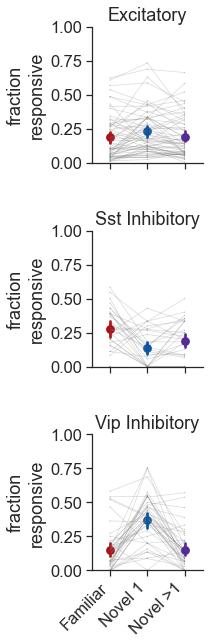

In [80]:
ppf.plot_fraction_responsive_cells(change_mdf, responsiveness_threshold=0.1, ylim=(0,1),
                                    save_dir=save_dir, folder=folder, suffix=change_suffix, horizontal=False, ax=None)

### by project code 


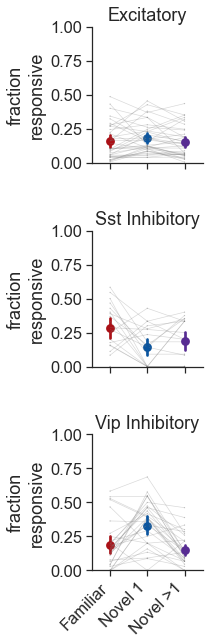

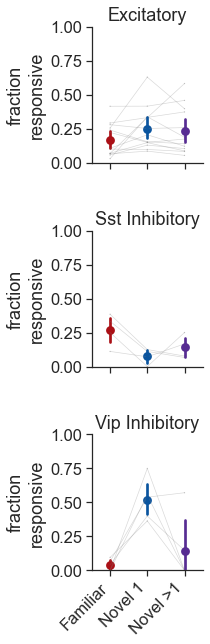

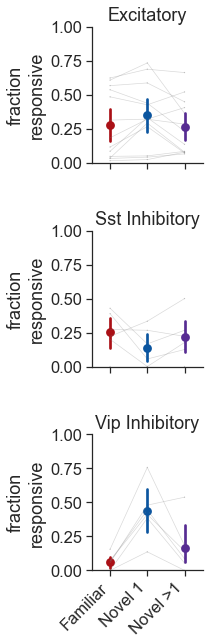

In [81]:
for project_code in change_mdf.project_code.unique(): 
    df = change_mdf[change_mdf.project_code==project_code].copy()
    ppf.plot_fraction_responsive_cells(df, responsiveness_threshold=0.1, ylim=(0,1),
                                    save_dir=save_dir, folder=folder, suffix=change_suffix+'_'+project_code, 
                                       horizontal=False, ax=None)

In [82]:
print(len(change_mdf.ophys_experiment_id.unique()))

402


### omissions

array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='fraction\nresponsive'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='fraction\nresponsive'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, ylabel='fraction\nresponsive'>],
      dtype=object)

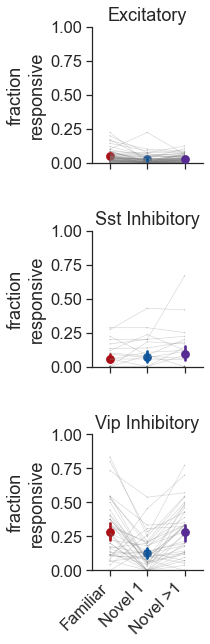

In [83]:
ppf.plot_fraction_responsive_cells(omission_mdf, responsiveness_threshold=0.1, ylim=(0,1),
                                    save_dir=save_dir, folder=folder, suffix=omission_suffix, horizontal=False, ax=None)

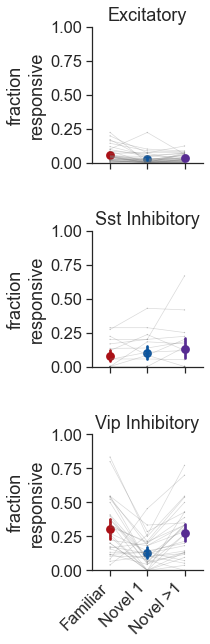

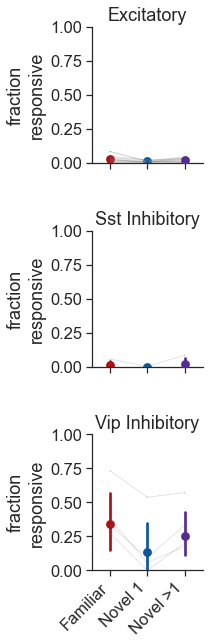

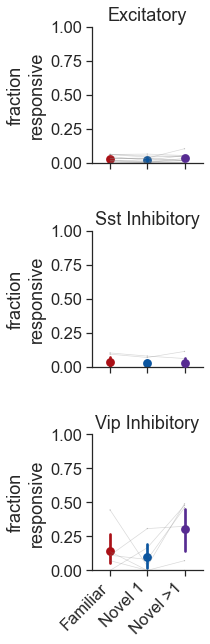

In [84]:
for project_code in change_mdf.project_code.unique(): 
    df = omission_mdf[omission_mdf.project_code==project_code].copy()
    ppf.plot_fraction_responsive_cells(df, responsiveness_threshold=0.1, ylim=(0,1),
                                    save_dir=save_dir, folder=folder, suffix=omission_suffix+'_'+project_code, 
                                       horizontal=False, ax=None)

## metrics disributions

### get cell metrics table for changes

In [85]:
import visual_behavior.ophys.response_analysis.cell_metrics as cm


In [86]:
experiments_table = experiment_table.copy()

In [87]:
ophys_experiment_ids = experiments_table.index.values

condition = 'changes'
stimuli = 'all_images'
session_subset = 'full_session'
    
change_metrics_table = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)


getting experiment table for March and August releases from lims
excluding Ai94 data
there are 1885 experiments after filtering for inclusion criteria -  None


  9%|███████▎                                                                       | 175/1885 [00:14<00:23, 71.78it/s]

problem for experiment 1008408506
problem for experiment 1008408502
problem for experiment 1008408511
problem for experiment 1008408509
problem for experiment 1008408508
problem for experiment 1008408514
problem for experiment 1008408512
problem for experiment 1009495880
problem for experiment 1009495875
problem for experiment 1009495882
problem for experiment 1009495885
problem for experiment 1009495876
problem for experiment 1009495883
problem for experiment 1009495879
problem for experiment 1009495873
problem for experiment 1010092806
problem for experiment 1010092810
problem for experiment 1010092809
problem for experiment 1010092812
problem for experiment 1010092802
problem for experiment 1010092798
problem for experiment 1010092800
problem for experiment 1010092804
problem for experiment 1010556652
problem for experiment 1010556659
problem for experiment 1010556648
problem for experiment 1010556662
problem for experiment 1010556650
problem for experiment 1010556658
problem for ex

 10%|████████                                                                      | 196/1885 [00:14<00:16, 103.92it/s]

problem for experiment 1010839676
problem for experiment 1010839670
problem for experiment 1010839678
problem for experiment 1010839675
problem for experiment 1010839673
problem for experiment 1010839672
problem for experiment 1011771121
problem for experiment 1011771132
problem for experiment 1012165647
problem for experiment 1012165652
problem for experiment 1012165650
problem for experiment 1012165644
problem for experiment 1012165653
problem for experiment 1012165646
problem for experiment 1012490781
problem for experiment 1012490787
problem for experiment 1012490786
problem for experiment 1012490789
problem for experiment 1012490784
problem for experiment 1012490778
problem for experiment 1012771658
problem for experiment 1012771657
problem for experiment 1012771661
problem for experiment 1012771664
problem for experiment 1012771663
problem for experiment 1012771660
problem for experiment 1012771655
problem for experiment 1012771666


 15%|███████████▉                                                                   | 284/1885 [00:20<00:35, 44.87it/s]

problem for experiment 975608414
problem for experiment 975608408
problem for experiment 975608420
problem for experiment 975608410
problem for experiment 975608418
problem for experiment 975608406
problem for experiment 975608416
problem for experiment 975608412
problem for experiment 976300315
problem for experiment 976300325
problem for experiment 976300319
problem for experiment 976300313
problem for experiment 976300311
problem for experiment 976300323
problem for experiment 976300321
problem for experiment 976300317
problem for experiment 977220487
problem for experiment 977220495
problem for experiment 977220485
problem for experiment 977220481
problem for experiment 977220493
problem for experiment 977220491
problem for experiment 977220489
problem for experiment 977220483
problem for experiment 977975802
problem for experiment 977975794
problem for experiment 977975804
problem for experiment 977975796
problem for experiment 977975800
problem for experiment 977975792
problem fo

 16%|████████████▋                                                                  | 304/1885 [00:20<00:19, 80.17it/s]

problem for experiment 978284056
problem for experiment 978284052
problem for experiment 978866900
problem for experiment 978866906
problem for experiment 978866908
problem for experiment 978866902
problem for experiment 978866904
problem for experiment 978866896
problem for experiment 978866910
problem for experiment 978866898


 19%|██████████████▊                                                                | 352/1885 [00:22<00:32, 47.24it/s]

problem for experiment 993369361
problem for experiment 993369357
problem for experiment 993369358
problem for experiment 993369355
problem for experiment 993369356
problem for experiment 993369360
problem for experiment 993369359
problem for experiment 993369362
problem for experiment 993619363
problem for experiment 993619355
problem for experiment 993619356
problem for experiment 993619354
problem for experiment 993619361
problem for experiment 993891316
problem for experiment 993891318
problem for experiment 993891315
problem for experiment 993891310
problem for experiment 993891311
problem for experiment 993891312
problem for experiment 993891313
problem for experiment 994082664
problem for experiment 994082654
problem for experiment 994082661
problem for experiment 994082663
problem for experiment 994082656
problem for experiment 994082660
problem for experiment 994082666
problem for experiment 994278587
problem for experiment 994278583
problem for experiment 994278586
problem fo

 20%|███████████████▋                                                               | 375/1885 [00:22<00:21, 71.42it/s]

problem for experiment 1101564155
problem for experiment 1101751320
problem for experiment 1101751314
problem for experiment 1101751316
problem for experiment 1101751326
problem for experiment 1101751323
problem for experiment 1102263520
problem for experiment 1102263507
problem for experiment 1102263509
problem for experiment 1102263517
problem for experiment 1102263512
problem for experiment 1102479792
problem for experiment 1102479794
problem for experiment 1102479801
problem for experiment 1102479797
problem for experiment 1102479805


 25%|███████████████████▎                                                           | 462/1885 [00:28<00:42, 33.37it/s]

problem for experiment 992619908
problem for experiment 992619913
problem for experiment 992619914
problem for experiment 992619915
problem for experiment 992619911
problem for experiment 992619909
problem for experiment 992889235
problem for experiment 992889234
problem for experiment 992889240
problem for experiment 992889237
problem for experiment 992889239
problem for experiment 992889241
problem for experiment 993618377
problem for experiment 993618376
problem for experiment 993618378
problem for experiment 993618372
problem for experiment 993618371
problem for experiment 993618374
problem for experiment 993891832
problem for experiment 993891837
problem for experiment 993891831
problem for experiment 993891834
problem for experiment 993891841
problem for experiment 994082686
problem for experiment 994082692
problem for experiment 994082689
problem for experiment 994082684
problem for experiment 994082693


 25%|████████████████████                                                           | 480/1885 [00:28<00:21, 66.69it/s]

problem for experiment 994279627
problem for experiment 994279629
problem for experiment 994279615
problem for experiment 994279625
problem for experiment 994279622
problem for experiment 994279617


 32%|█████████████████████████▏                                                     | 600/1885 [00:37<00:18, 67.83it/s]

problem for experiment 964615767
problem for experiment 964615773
problem for experiment 964615779
problem for experiment 964615769
problem for experiment 964615771
problem for experiment 964615781
problem for experiment 964615775
problem for experiment 964615777
problem for experiment 965267331
problem for experiment 965267333
problem for experiment 965267339
problem for experiment 965267335
problem for experiment 965267329
problem for experiment 965267343
problem for experiment 965267341
problem for experiment 965980156
problem for experiment 965980150
problem for experiment 965980158
problem for experiment 965980154
problem for experiment 965980147
problem for experiment 965980152
problem for experiment 965980160
problem for experiment 965980162
problem for experiment 967906375
problem for experiment 967906387
problem for experiment 967906390
problem for experiment 967906381
problem for experiment 967906379
problem for experiment 967906392
problem for experiment 967906377
problem fo

 33%|█████████████████████████▉                                                     | 619/1885 [00:37<00:13, 93.92it/s]

problem for experiment 968717810
problem for experiment 969841045
problem for experiment 969841043
problem for experiment 969841049
problem for experiment 969841037
problem for experiment 969841039
problem for experiment 969841047
problem for experiment 969841035
problem for experiment 969841041
problem for experiment 1097240223
problem for experiment 1097240226
problem for experiment 1097240230
problem for experiment 1097240233
problem for experiment 1097240225
problem for experiment 1097240235
problem for experiment 1097240232
problem for experiment 1097240229
problem for experiment 1097813079
problem for experiment 1097813081
problem for experiment 1097813085
problem for experiment 1097813083
problem for experiment 1097813077
problem for experiment 1097813090
problem for experiment 1097813087
problem for experiment 1097813088
problem for experiment 1098014583
problem for experiment 1098014578
problem for experiment 1098014582
problem for experiment 1098014575
problem for experiment 

 34%|██████████████████████████▊                                                   | 649/1885 [00:37<00:11, 103.09it/s]

problem for experiment 1098444819
problem for experiment 1098444822
problem for experiment 1098444824
problem for experiment 1098444826
problem for experiment 1098444831
problem for experiment 1098444828
problem for experiment 1098444821
problem for experiment 1098682216
problem for experiment 1098682223
problem for experiment 1098682220
problem for experiment 1098682219
problem for experiment 1098682214
problem for experiment 1098682217
problem for experiment 1098682225
problem for experiment 1098682222
problem for experiment 1099240320
problem for experiment 1099240326
problem for experiment 1099240329
problem for experiment 1099240327
problem for experiment 1099240323
problem for experiment 1099240317
problem for experiment 1099240321
problem for experiment 1099240324


 41%|████████████████████████████████▊                                              | 782/1885 [00:48<00:20, 54.93it/s]

problem for experiment 1109401383
problem for experiment 1109401380
problem for experiment 1109401391
problem for experiment 1109401386
problem for experiment 1109401388
problem for experiment 1109401382
problem for experiment 1109401389
problem for experiment 1109401385
problem for experiment 1109580764
problem for experiment 1109580766
problem for experiment 1109580769
problem for experiment 1109580772
problem for experiment 1109580763
problem for experiment 1109580760
problem for experiment 1109580770
problem for experiment 1109786071
problem for experiment 1109786084
problem for experiment 1109786073
problem for experiment 1109786074
problem for experiment 1109786076
problem for experiment 1109786077
problem for experiment 1109786079
problem for experiment 1109786082
problem for experiment 1109986154
problem for experiment 1109986151
problem for experiment 1109986161
problem for experiment 1109986156
problem for experiment 1109986158
problem for experiment 1109986147
problem for ex

 42%|█████████████████████████████████▎                                             | 795/1885 [00:48<00:15, 70.38it/s]

problem for experiment 1110928069
problem for experiment 1110928072
problem for experiment 1110928073
problem for experiment 1110928075
problem for experiment 1110928064
problem for experiment 1110928067
problem for experiment 1110928070
problem for experiment 1110928066


 50%|███████████████████████████████████████▊                                       | 949/1885 [01:03<00:17, 54.66it/s]

problem for experiment 966323518
problem for experiment 966323521
problem for experiment 966323512
problem for experiment 966323514
problem for experiment 966323525
problem for experiment 966323527
problem for experiment 966323516
problem for experiment 966323523
problem for experiment 967040458
problem for experiment 967040464
problem for experiment 967040449
problem for experiment 967040454
problem for experiment 967040466
problem for experiment 967040451
problem for experiment 967040460
problem for experiment 967040462
problem for experiment 969430845
problem for experiment 969430849
problem for experiment 969430853
problem for experiment 969430840
problem for experiment 969841065
problem for experiment 969841053
problem for experiment 969841067
problem for experiment 969841063
problem for experiment 969841061
problem for experiment 969841059
problem for experiment 969841057
problem for experiment 969841055
problem for experiment 972233200
problem for experiment 972233209
problem fo

 51%|████████████████████████████████████████▌                                      | 968/1885 [01:03<00:10, 85.98it/s]

problem for experiment 972760508
problem for experiment 972760502
problem for experiment 972760506
problem for experiment 972760498
problem for experiment 972760510
problem for experiment 972760513
problem for experiment 974434634
problem for experiment 974434627
problem for experiment 974434623
problem for experiment 974434630
problem for experiment 974434632
problem for experiment 974434621
problem for experiment 974434625
problem for experiment 974434636


 54%|██████████████████████████████████████████                                    | 1015/1885 [01:05<00:22, 37.94it/s]

problem for experiment 1105176661
problem for experiment 1105176655
problem for experiment 1105176653
problem for experiment 1105176659
problem for experiment 1105176658
problem for experiment 1106021621
problem for experiment 1106021614
problem for experiment 1106021620
problem for experiment 1106021623
problem for experiment 1106021616
problem for experiment 1106021626
problem for experiment 1106021617
problem for experiment 1107079229
problem for experiment 1107079228
problem for experiment 1107079235
problem for experiment 1107079226
problem for experiment 1107079222
problem for experiment 1107079231
problem for experiment 1107079232
problem for experiment 1107079225
problem for experiment 1107463720
problem for experiment 1107463723
problem for experiment 1107463732
problem for experiment 1107463729
problem for experiment 1107463726
problem for experiment 1107463722
problem for experiment 1107463725
problem for experiment 1107463730
problem for experiment 1108000070
problem for ex

 61%|███████████████████████████████████████████████▌                              | 1149/1885 [01:16<00:35, 20.86it/s]

problem for experiment 1100880623
problem for experiment 1101156981
problem for experiment 1101388675
problem for experiment 1102263502
problem for experiment 1102675271
problem for experiment 1102932447


 64%|██████████████████████████████████████████████████▏                           | 1212/1885 [01:22<00:20, 33.55it/s]

problem for experiment 1058613912
problem for experiment 1058835243
problem for experiment 1058835245
problem for experiment 1059574068
problem for experiment 1059574080
problem for experiment 1059574074
problem for experiment 1059792827
problem for experiment 1060220575
problem for experiment 1060220585
problem for experiment 1060220573
problem for experiment 1060223940
problem for experiment 1060223944
problem for experiment 1060223950


 71%|███████████████████████████████████████████████████████▍                      | 1339/1885 [01:35<00:13, 40.38it/s]

problem for experiment 959389434
problem for experiment 959389438
problem for experiment 959389428
problem for experiment 959389424
problem for experiment 959389431
problem for experiment 959389440
problem for experiment 959389426
problem for experiment 959389436
problem for experiment 960405653
problem for experiment 960405655
problem for experiment 960405661
problem for experiment 960405663
problem for experiment 960405659
problem for experiment 960405649
problem for experiment 960405657
problem for experiment 960995095
problem for experiment 960995107
problem for experiment 960995093
problem for experiment 960995097
problem for experiment 960995103
problem for experiment 960995101
problem for experiment 960995099
problem for experiment 962676811
problem for experiment 962676815
problem for experiment 962676798
problem for experiment 962676807
problem for experiment 962676817
problem for experiment 962676802
problem for experiment 962676805
problem for experiment 963449009
problem fo

 73%|████████████████████████████████████████████████████████▋                     | 1370/1885 [01:35<00:07, 70.46it/s]

problem for experiment 963449011
problem for experiment 963449003
problem for experiment 963449005
problem for experiment 963449007
problem for experiment 963449001
problem for experiment 964615764
problem for experiment 964615749
problem for experiment 964615760
problem for experiment 964615743
problem for experiment 964615753
problem for experiment 964615757
problem for experiment 964615755
problem for experiment 964615746


 81%|███████████████████████████████████████████████████████████████               | 1523/1885 [01:49<00:08, 40.26it/s]

problem for experiment 1038382403
problem for experiment 1038382406
problem for experiment 1038382396
problem for experiment 1038382394
problem for experiment 1038382397
problem for experiment 1038382401
problem for experiment 1038382400
problem for experiment 1039163370
problem for experiment 1039163366
problem for experiment 1039163367
problem for experiment 1039163369
problem for experiment 1039163364
problem for experiment 1039163372
problem for experiment 1039163375
problem for experiment 1039384487
problem for experiment 1039384488
problem for experiment 1039384482
problem for experiment 1039384484
problem for experiment 1039384485
problem for experiment 1039384490
problem for experiment 1039384493
problem for experiment 1039693314
problem for experiment 1039693324
problem for experiment 1039693318
problem for experiment 1039693315
problem for experiment 1039693317
problem for experiment 1039693320
problem for experiment 1039693311
problem for experiment 1039954546
problem for ex

 82%|████████████████████████████████████████████████████████████████              | 1547/1885 [01:49<00:04, 79.29it/s]

problem for experiment 1040982830
problem for experiment 1040982812
problem for experiment 1040982826
problem for experiment 1040982821
problem for experiment 1041171740
problem for experiment 1041171735
problem for experiment 1041171729
problem for experiment 1041171732
problem for experiment 1041171737
problem for experiment 1041171734
problem for experiment 1041171731


 86%|██████████████████████████████████████████████████████████████████▉           | 1619/1885 [01:55<00:08, 32.68it/s]

problem for experiment 1105367880
problem for experiment 1105367877
problem for experiment 1105367875
problem for experiment 1105367874
problem for experiment 1105664347
problem for experiment 1105664344
problem for experiment 1105664343
problem for experiment 1105664346
problem for experiment 1105664349
problem for experiment 1106021638
problem for experiment 1106021628
problem for experiment 1106021631
problem for experiment 1106021632
problem for experiment 1106871915
problem for experiment 1106871918
problem for experiment 1106871916
problem for experiment 1106871919
problem for experiment 1106871913
problem for experiment 1108231902
problem for experiment 1108231904
problem for experiment 1108231898
problem for experiment 1108231901
problem for experiment 1108231899
problem for experiment 1108231895
problem for experiment 1108445077
problem for experiment 1108445079
problem for experiment 1108445070
problem for experiment 1108445076
problem for experiment 1108445073
problem for ex

 91%|██████████████████████████████████████████████████████████████████████▉       | 1713/1885 [02:03<00:03, 46.41it/s]

problem for experiment 1087608395
problem for experiment 1087608393
problem for experiment 1087608402
problem for experiment 1087608399
problem for experiment 1087608400
problem for experiment 1087608397
problem for experiment 1088351102
problem for experiment 1088351108
problem for experiment 1088351105
problem for experiment 1088351100
problem for experiment 1088351106
problem for experiment 1088351103
problem for experiment 1088351099
problem for experiment 1088351097
problem for experiment 1088916609
problem for experiment 1088916606
problem for experiment 1088916611
problem for experiment 1088916608
problem for experiment 1088916605
problem for experiment 1088916614
problem for experiment 1088916603
problem for experiment 1088916612
problem for experiment 1089128027
problem for experiment 1089128034
problem for experiment 1089128037
problem for experiment 1089128036
problem for experiment 1089128029
problem for experiment 1089128031
problem for experiment 1089128033
problem for ex

 92%|████████████████████████████████████████████████████████████████████████      | 1742/1885 [02:03<00:01, 72.14it/s]

problem for experiment 1089407829
problem for experiment 1089407838
problem for experiment 1089407835
problem for experiment 1089407842
problem for experiment 1090442507
problem for experiment 1090442499
problem for experiment 1090442505
problem for experiment 1090442502
problem for experiment 1090442500
problem for experiment 1090442496
problem for experiment 1090442509
problem for experiment 1090442503


 99%|█████████████████████████████████████████████████████████████████████████████▎| 1869/1885 [02:15<00:00, 59.61it/s]

problem for experiment 1006562227
problem for experiment 1006562224
problem for experiment 1006562218
problem for experiment 1006562223
problem for experiment 1006562220
problem for experiment 1006562221
problem for experiment 1009495893
problem for experiment 1009495897
problem for experiment 1009495886
problem for experiment 1009495888
problem for experiment 1009495889
problem for experiment 1009495892
problem for experiment 1010092819
problem for experiment 1010092816
problem for experiment 1010092813
problem for experiment 1010092822
problem for experiment 1010557557
problem for experiment 1010557560
problem for experiment 1010557562
problem for experiment 1010557566
problem for experiment 1010557563
problem for experiment 1012165663
problem for experiment 1012165660
problem for experiment 1012165666
problem for experiment 1012165657
problem for experiment 1012165662


100%|██████████████████████████████████████████████████████████████████████████████| 1885/1885 [02:16<00:00, 13.78it/s]
C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\pandas\core\generic.py:2718: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['condition', 'data_type', 'exception', 'filter_events', 'interpolate',
       'ophys_experiment_id', 'session_subset', 'stimuli', 'use_events'],
      dtype='object')]

  encoding=encoding,


there are 1249 experiments in the returned cell_metrics table


In [88]:
print(len(change_metrics_table.ophys_experiment_id.unique()))

402


### save descriptive statistics for all metrics

In [89]:
conditions = ['cell_type', 'experience_level']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)

conditions = ['cell_type', 'experience_level', 'targeted_structure']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)


conditions = ['cell_type', 'experience_level', 'layer']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)


conditions = ['cell_type', 'experience_level', 'targeted_structure', 'layer']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(change_metrics_table, condition, conditions, save_dir, filename)

In [90]:
# metrics_stats = load_descriptive_stats_for_conditions(conditions, save_dir, filename)

### plotting

In [91]:
# test stats
anova, tukey_table = ppf.test_significant_metric_averages(change_metrics_table, 'change_modulation_index')
tukey_table

,group1,group2,meandiff,lower,upper,reject,x1,x2,one_way_anova_p_val
0,Familiar,Novel 1,0.0764,0.0595,0.0934,True,0,1,3.886419e-25
1,Familiar,Novel >1,0.0332,0.0159,0.0504,True,0,2,3.886419e-25
2,Novel 1,Novel >1,-0.0433,-0.0601,-0.0264,True,1,2,3.886419e-25


saving_stats


array([<AxesSubplot:title={'center':'Excitatory'}, ylabel='change response'>,
       <AxesSubplot:title={'center':'Sst Inhibitory'}, ylabel='change response'>,
       <AxesSubplot:title={'center':'Vip Inhibitory'}, ylabel='change response'>],
      dtype=object)

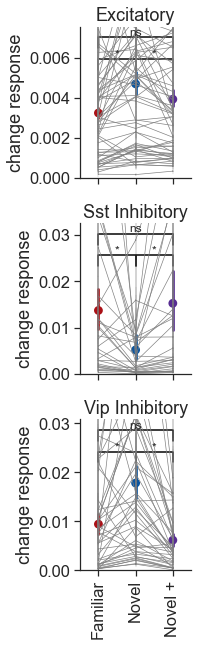

In [92]:
metric = 'change_response'
ylabel = 'change response'
event_type = 'changes'

ppf.plot_metric_distribution_by_experience(change_metrics_table, metric, event_type, stripplot=False, pointplot=True, add_zero_line=False,
                                       show_containers=True, ylabel=ylabel, ylims=None, save_dir=save_dir, ax=None) #ylims=(-0.001, 0.025)


### change response

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


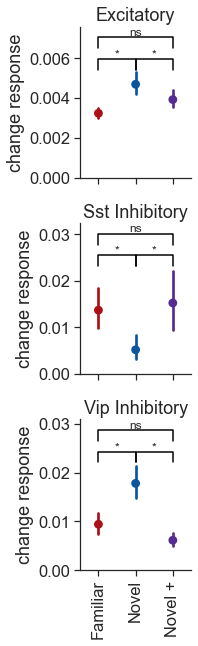

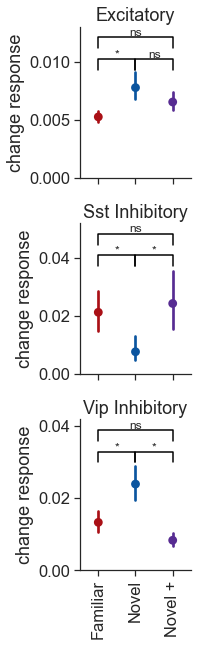

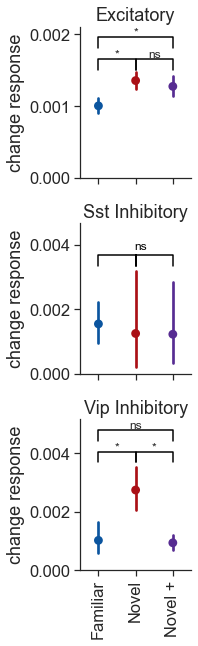

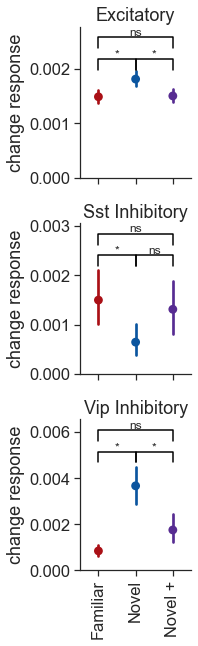

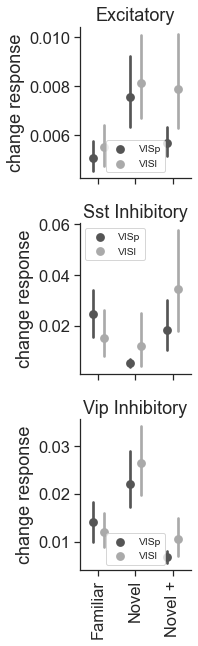

...

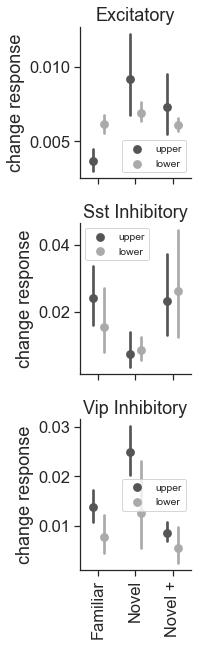

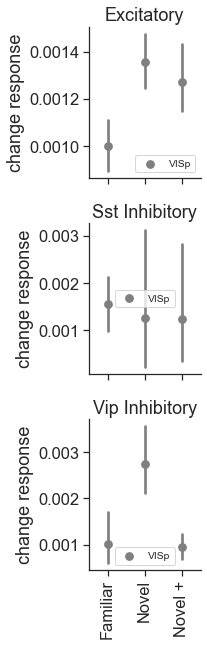

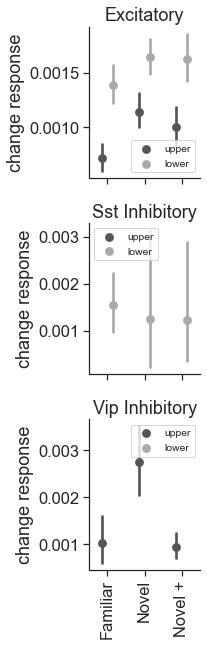

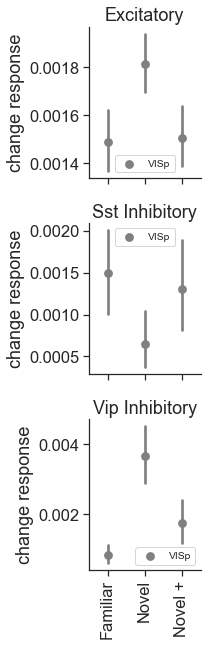

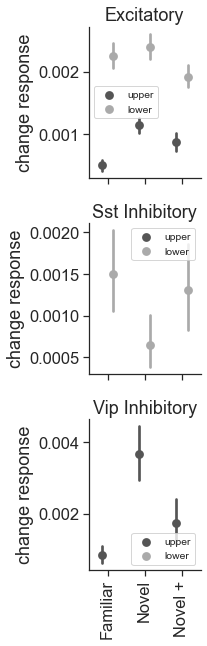

In [93]:
# mean response across experience levels 
metric = 'change_response'
ylabel = 'change response'
ylabel = 'event magnitude'

event_type = 'changes'

ylims = None #(-0.001, 0.025)

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel='change response', ylims=ylims, add_zero_line=False, save_dir=save_dir)

### pre-change response

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


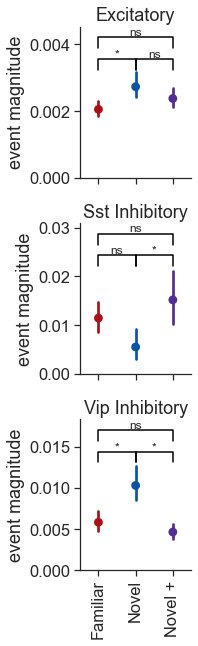

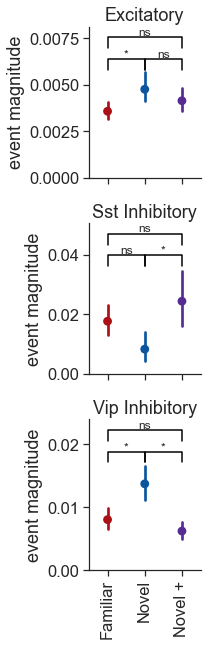

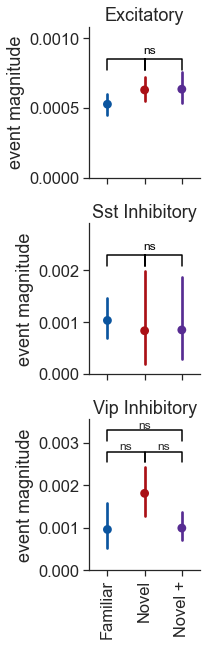

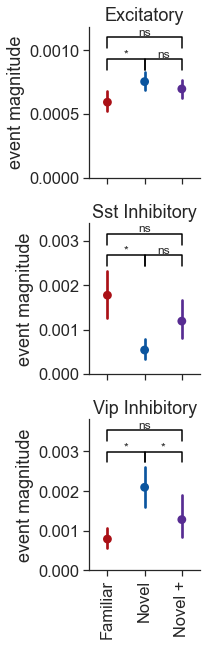

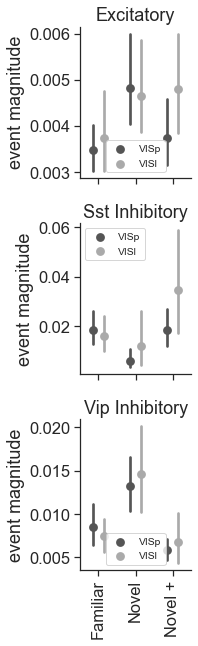

...

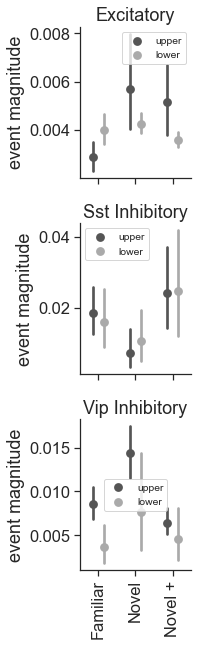

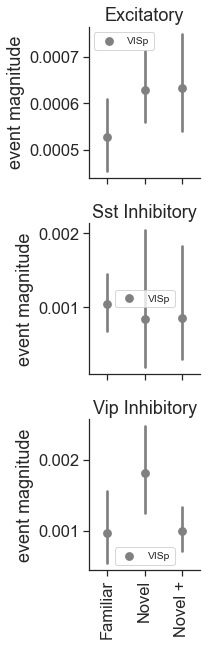

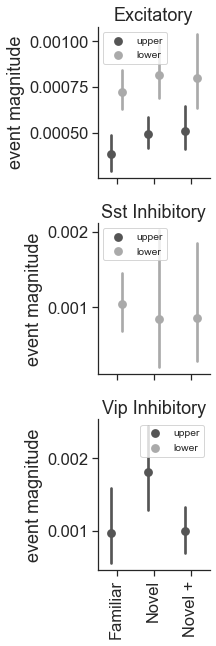

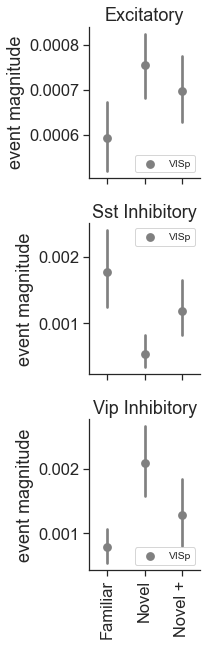

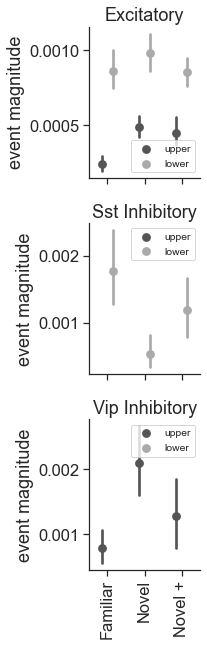

In [94]:
# mean response across experience levels 
metric = 'pre_change_response'
ylabel = 'pre-change response'
ylabel = 'event magnitude'

event_type = 'pre_change'

ylims = None #(-0.001, 0.025)

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### change modulation index

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


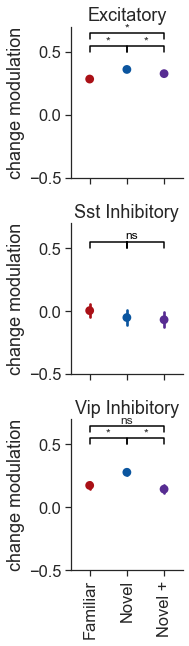

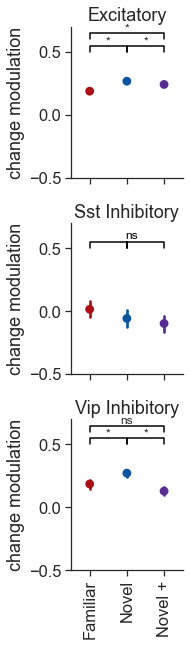

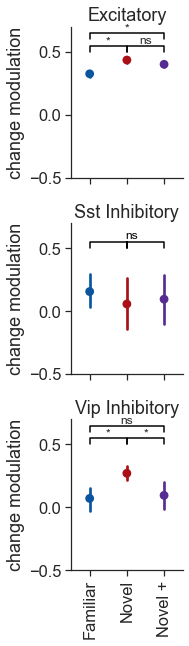

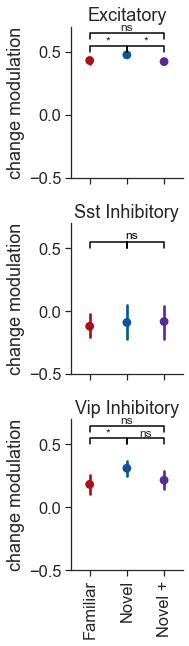

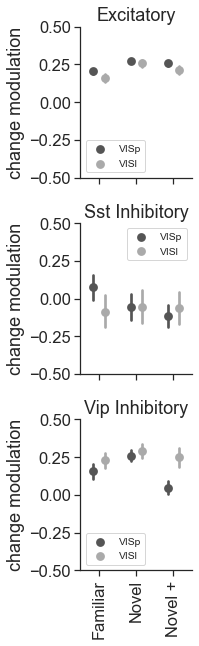

...

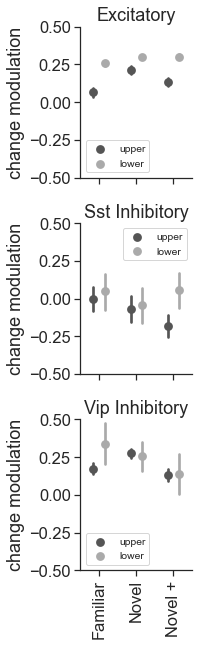

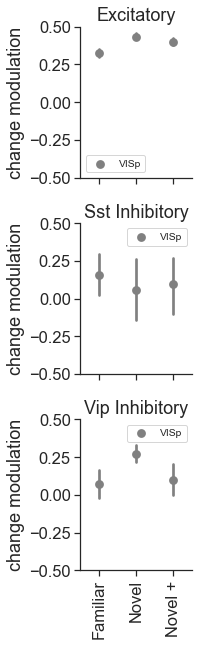

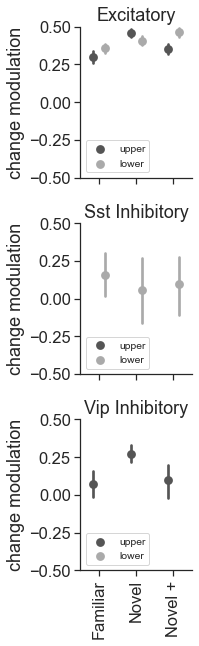

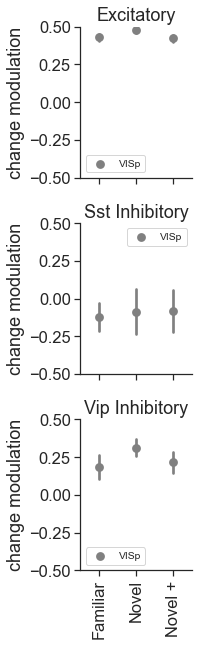

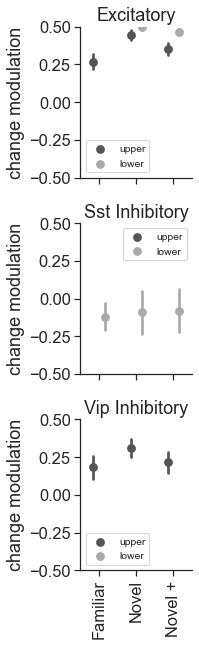

In [95]:
metric = 'change_modulation_index'
ylabel = 'change modulation'
event_type = 'changes'

ylims = (-0.5, 0.5)


metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### reliability

please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats


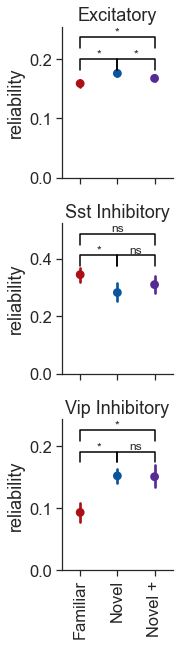

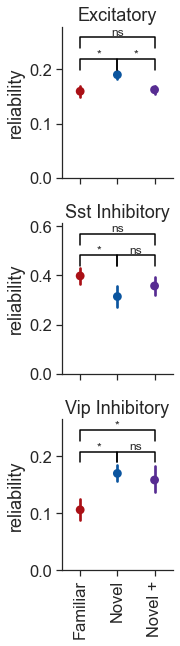

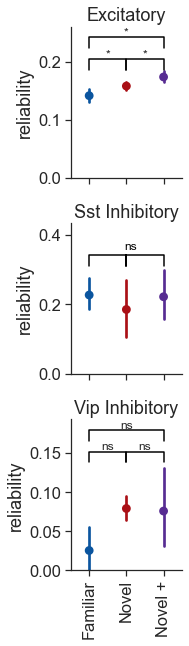

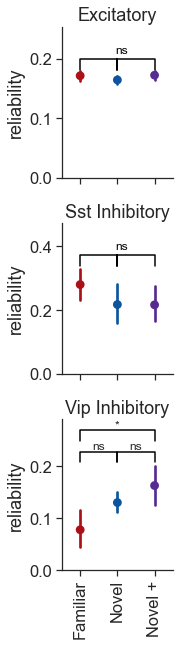

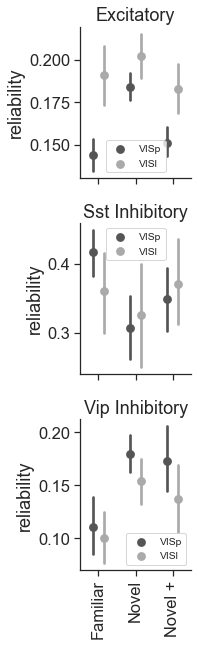

...

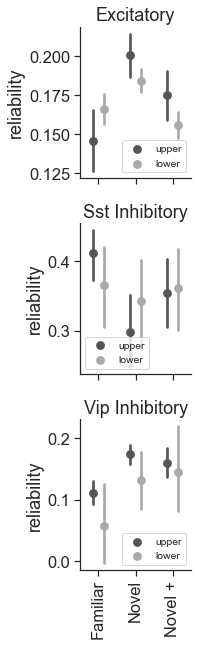

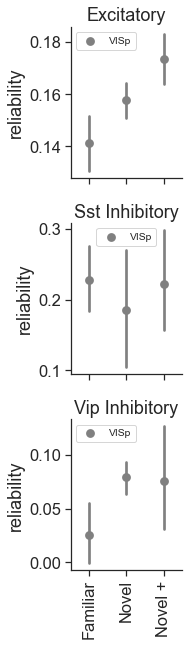

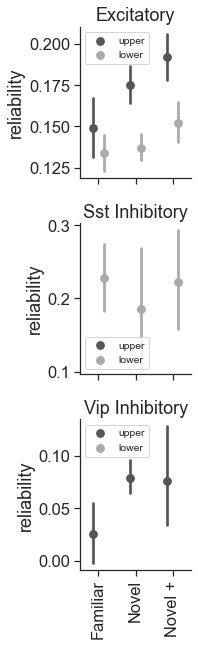

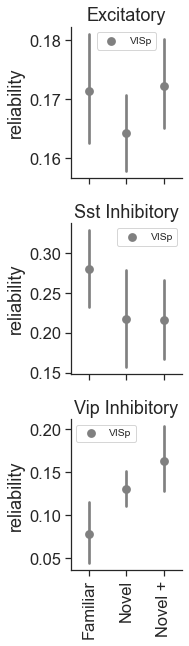

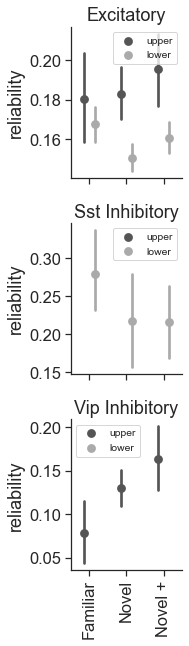

In [96]:
metric = 'reliability'
ylabel = 'reliability'
event_type = 'changes'

ylims = None

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### lifetime sparseness

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


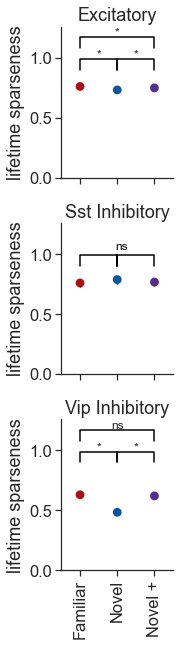

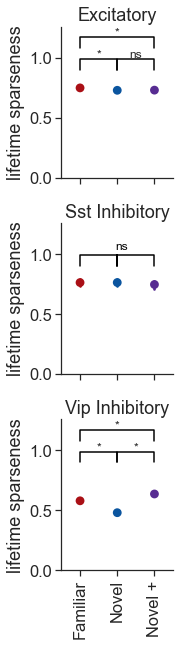

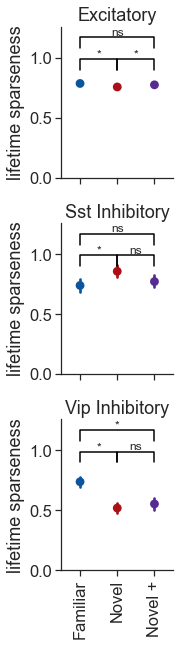

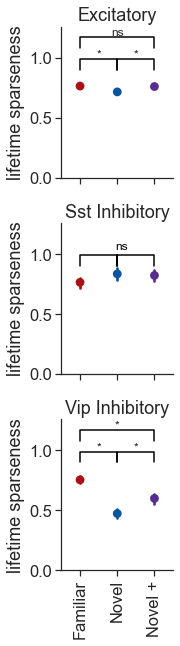

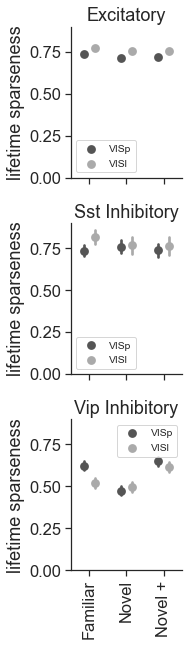

...

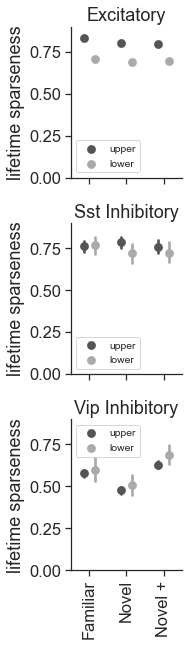

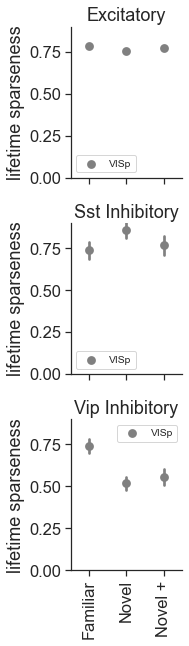

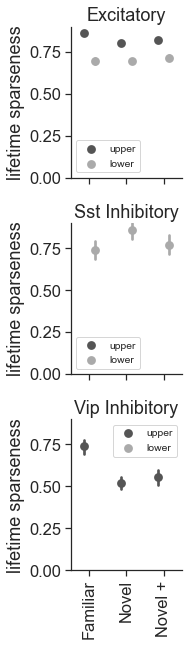

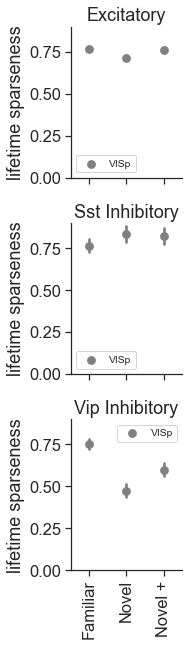

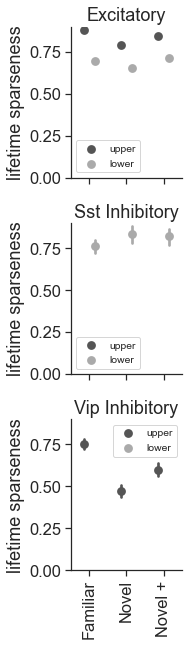

In [97]:
metric = 'lifetime_sparseness'
ylabel = 'lifetime sparseness'
event_type = 'changes'

ylims = (-0.001, 0.9)

metrics_table = change_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### experience modulation of change response

402 experiments in metric_data after merging with cells_table


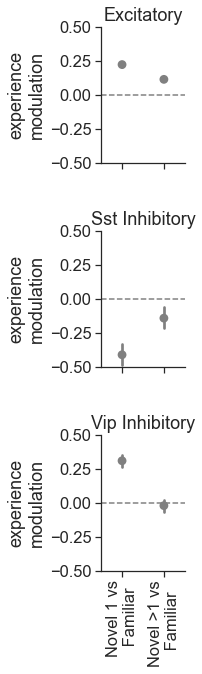

In [98]:
metric = 'change_response'
event_type = 'changes'

metric_data = cm.compute_experience_modulation_index(change_metrics_table, metric, cells_table)
metric_data = metric_data.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(metric_data, event_type, save_dir=None)


## omissions 

In [99]:
ophys_experiment_ids = experiments_table.index.values

condition = 'omissions'
stimuli = 'all_images'
session_subset = 'full_session'
    
omission_metrics_table = cm.get_cell_metrics_for_conditions(data_type, condition, stimuli, session_subset, inclusion_criteria)

getting experiment table for March and August releases from lims
excluding Ai94 data
there are 1885 experiments after filtering for inclusion criteria -  None


  8%|██████▋                                                                        | 159/1885 [00:16<00:43, 40.13it/s]

problem for experiment 1008408506
problem for experiment 1008408502
problem for experiment 1008408511
problem for experiment 1008408509
problem for experiment 1008408508
problem for experiment 1008408514
problem for experiment 1008408512
problem for experiment 1009495880
problem for experiment 1009495875
problem for experiment 1009495882
problem for experiment 1009495885
problem for experiment 1009495876
problem for experiment 1009495883
problem for experiment 1009495879
problem for experiment 1009495873
problem for experiment 1010092806
problem for experiment 1010092810
problem for experiment 1010092809
problem for experiment 1010092812
problem for experiment 1010092802
problem for experiment 1010092798
problem for experiment 1010092800


 10%|████████                                                                      | 196/1885 [00:16<00:16, 101.42it/s]

problem for experiment 1010092804
problem for experiment 1010556652
problem for experiment 1010556659
problem for experiment 1010556648
problem for experiment 1010556662
problem for experiment 1010556650
problem for experiment 1010556658
problem for experiment 1010556655
problem for experiment 1010839669
problem for experiment 1010839667
problem for experiment 1010839676
problem for experiment 1010839670
problem for experiment 1010839678
problem for experiment 1010839675
problem for experiment 1010839673
problem for experiment 1010839672
problem for experiment 1011771121
problem for experiment 1011771132
problem for experiment 1012165647
problem for experiment 1012165652
problem for experiment 1012165650
problem for experiment 1012165644
problem for experiment 1012165653
problem for experiment 1012165646
problem for experiment 1012490781
problem for experiment 1012490787
problem for experiment 1012490786
problem for experiment 1012490789
problem for experiment 1012490784
problem for ex

 15%|███████████▉                                                                   | 286/1885 [00:23<00:33, 47.87it/s]

problem for experiment 975608414
problem for experiment 975608408
problem for experiment 975608420
problem for experiment 975608410
problem for experiment 975608418
problem for experiment 975608406
problem for experiment 975608416
problem for experiment 975608412
problem for experiment 976300315
problem for experiment 976300325
problem for experiment 976300319
problem for experiment 976300313
problem for experiment 976300311
problem for experiment 976300323
problem for experiment 976300321
problem for experiment 976300317
problem for experiment 977220487
problem for experiment 977220495
problem for experiment 977220485
problem for experiment 977220481
problem for experiment 977220493
problem for experiment 977220491
problem for experiment 977220489
problem for experiment 977220483
problem for experiment 977975802
problem for experiment 977975794
problem for experiment 977975804
problem for experiment 977975796
problem for experiment 977975800


 16%|████████████▍                                                                  | 298/1885 [00:23<00:26, 60.43it/s]

problem for experiment 977975792
problem for experiment 977975798
problem for experiment 977975790
problem for experiment 978284064
problem for experiment 978284060
problem for experiment 978284054
problem for experiment 978284048
problem for experiment 978284050
problem for experiment 978284056
problem for experiment 978284052
problem for experiment 978866900
problem for experiment 978866906
problem for experiment 978866908
problem for experiment 978866902
problem for experiment 978866904
problem for experiment 978866896
problem for experiment 978866910
problem for experiment 978866898


 18%|██████████████▍                                                                | 343/1885 [00:25<00:48, 31.75it/s]

problem for experiment 993369361
problem for experiment 993369357
problem for experiment 993369358
problem for experiment 993369355
problem for experiment 993369356
problem for experiment 993369360
problem for experiment 993369359
problem for experiment 993369362
problem for experiment 993619363
problem for experiment 993619355
problem for experiment 993619356
problem for experiment 993619354
problem for experiment 993619361
problem for experiment 993891316
problem for experiment 993891318
problem for experiment 993891315
problem for experiment 993891310
problem for experiment 993891311
problem for experiment 993891312
problem for experiment 993891313
problem for experiment 994082664
problem for experiment 994082654
problem for experiment 994082661
problem for experiment 994082663
problem for experiment 994082656
problem for experiment 994082660
problem for experiment 994082666
problem for experiment 994278587


 20%|███████████████▉                                                               | 380/1885 [00:25<00:21, 68.83it/s]

problem for experiment 994278583
problem for experiment 994278586
problem for experiment 994278589
problem for experiment 994278592
problem for experiment 994278581
problem for experiment 1101388656
problem for experiment 1101388659
problem for experiment 1101388662
problem for experiment 1101388653
problem for experiment 1101564168
problem for experiment 1101564165
problem for experiment 1101564161
problem for experiment 1101564155
problem for experiment 1101751320
problem for experiment 1101751314
problem for experiment 1101751316
problem for experiment 1101751326
problem for experiment 1101751323
problem for experiment 1102263520
problem for experiment 1102263507
problem for experiment 1102263509
problem for experiment 1102263517
problem for experiment 1102263512
problem for experiment 1102479792
problem for experiment 1102479794
problem for experiment 1102479801
problem for experiment 1102479797
problem for experiment 1102479805


 25%|███████████████████▍                                                           | 465/1885 [00:33<00:40, 34.79it/s]

problem for experiment 992619908
problem for experiment 992619913
problem for experiment 992619914
problem for experiment 992619915
problem for experiment 992619911
problem for experiment 992619909
problem for experiment 992889235
problem for experiment 992889234
problem for experiment 992889240
problem for experiment 992889237
problem for experiment 992889239
problem for experiment 992889241
problem for experiment 993618377
problem for experiment 993618376
problem for experiment 993618378
problem for experiment 993618372
problem for experiment 993618371
problem for experiment 993618374
problem for experiment 993891832
problem for experiment 993891837
problem for experiment 993891831
problem for experiment 993891834
problem for experiment 993891841
problem for experiment 994082686
problem for experiment 994082692
problem for experiment 994082689
problem for experiment 994082684
problem for experiment 994082693
problem for experiment 994279627


 26%|████████████████████▏                                                          | 483/1885 [00:33<00:21, 63.82it/s]

problem for experiment 994279629
problem for experiment 994279615
problem for experiment 994279625
problem for experiment 994279622
problem for experiment 994279617


 31%|████████████████████████                                                       | 575/1885 [00:41<00:46, 27.94it/s]

problem for experiment 964615767
problem for experiment 964615773
problem for experiment 964615779
problem for experiment 964615769
problem for experiment 964615771
problem for experiment 964615781
problem for experiment 964615775
problem for experiment 964615777
problem for experiment 965267331
problem for experiment 965267333
problem for experiment 965267339
problem for experiment 965267335
problem for experiment 965267329
problem for experiment 965267343
problem for experiment 965267341
problem for experiment 965980156
problem for experiment 965980150
problem for experiment 965980158
problem for experiment 965980154
problem for experiment 965980147
problem for experiment 965980152
problem for experiment 965980160
problem for experiment 965980162
problem for experiment 967906375
problem for experiment 967906387


 33%|█████████████████████████▋                                                     | 614/1885 [00:41<00:14, 88.86it/s]

problem for experiment 967906390
problem for experiment 967906381
problem for experiment 967906379
problem for experiment 967906392
problem for experiment 967906377
problem for experiment 968717806
problem for experiment 968717804
problem for experiment 968717796
problem for experiment 968717802
problem for experiment 968717808
problem for experiment 968717800
problem for experiment 968717810
problem for experiment 969841045
problem for experiment 969841043
problem for experiment 969841049
problem for experiment 969841037
problem for experiment 969841039
problem for experiment 969841047
problem for experiment 969841035
problem for experiment 969841041
problem for experiment 1097240223
problem for experiment 1097240226
problem for experiment 1097240230
problem for experiment 1097240233
problem for experiment 1097240225
problem for experiment 1097240235
problem for experiment 1097240232
problem for experiment 1097240229
problem for experiment 1097813079
problem for experiment 1097813081


 34%|██████████████████████████▌                                                   | 641/1885 [00:41<00:12, 100.14it/s]

problem for experiment 1097813085
problem for experiment 1097813083
problem for experiment 1097813077
problem for experiment 1097813090
problem for experiment 1097813087
problem for experiment 1097813088
problem for experiment 1098014583
problem for experiment 1098014578
problem for experiment 1098014582
problem for experiment 1098014575
problem for experiment 1098014576
problem for experiment 1098014579
problem for experiment 1098014585
problem for experiment 1098014572
problem for experiment 1098444829
problem for experiment 1098444819
problem for experiment 1098444822
problem for experiment 1098444824
problem for experiment 1098444826
problem for experiment 1098444831
problem for experiment 1098444828
problem for experiment 1098444821
problem for experiment 1098682216
problem for experiment 1098682223
problem for experiment 1098682220
problem for experiment 1098682219
problem for experiment 1098682214
problem for experiment 1098682217


 35%|███████████████████████████▌                                                   | 658/1885 [00:42<00:12, 95.91it/s]

problem for experiment 1098682225
problem for experiment 1098682222
problem for experiment 1099240320
problem for experiment 1099240326
problem for experiment 1099240329
problem for experiment 1099240327
problem for experiment 1099240323
problem for experiment 1099240317
problem for experiment 1099240321
problem for experiment 1099240324


 41%|████████████████████████████████                                               | 765/1885 [00:52<00:49, 22.72it/s]

problem for experiment 1109401383
problem for experiment 1109401380
problem for experiment 1109401391
problem for experiment 1109401386
problem for experiment 1109401388
problem for experiment 1109401382
problem for experiment 1109401389
problem for experiment 1109401385
problem for experiment 1109580764
problem for experiment 1109580766
problem for experiment 1109580769
problem for experiment 1109580772
problem for experiment 1109580763
problem for experiment 1109580760
problem for experiment 1109580770
problem for experiment 1109786071
problem for experiment 1109786084
problem for experiment 1109786073
problem for experiment 1109786074
problem for experiment 1109786076
problem for experiment 1109786077
problem for experiment 1109786079
problem for experiment 1109786082


 42%|█████████████████████████████████▍                                             | 797/1885 [00:52<00:16, 64.16it/s]

problem for experiment 1109986154
problem for experiment 1109986151
problem for experiment 1109986161
problem for experiment 1109986156
problem for experiment 1109986158
problem for experiment 1109986147
problem for experiment 1109986150
problem for experiment 1109986153
problem for experiment 1110928069
problem for experiment 1110928072
problem for experiment 1110928073
problem for experiment 1110928075
problem for experiment 1110928064
problem for experiment 1110928067
problem for experiment 1110928070
problem for experiment 1110928066


 50%|███████████████████████████████████████▌                                       | 945/1885 [01:06<00:23, 40.68it/s]

problem for experiment 966323518
problem for experiment 966323521
problem for experiment 966323512
problem for experiment 966323514
problem for experiment 966323525
problem for experiment 966323527
problem for experiment 966323516
problem for experiment 966323523
problem for experiment 967040458
problem for experiment 967040464
problem for experiment 967040449
problem for experiment 967040454
problem for experiment 967040466
problem for experiment 967040451
problem for experiment 967040460
problem for experiment 967040462
problem for experiment 969430845
problem for experiment 969430849
problem for experiment 969430853
problem for experiment 969430840
problem for experiment 969841065
problem for experiment 969841053
problem for experiment 969841067
problem for experiment 969841063
problem for experiment 969841061
problem for experiment 969841059
problem for experiment 969841057
problem for experiment 969841055
problem for experiment 972233200
problem for experiment 972233209
problem fo

 51%|████████████████████████████████████████▌                                      | 968/1885 [01:06<00:11, 78.21it/s]

problem for experiment 972760498
problem for experiment 972760510
problem for experiment 972760513
problem for experiment 974434634
problem for experiment 974434627
problem for experiment 974434623
problem for experiment 974434630
problem for experiment 974434632
problem for experiment 974434621
problem for experiment 974434625
problem for experiment 974434636


 54%|█████████████████████████████████████████▉                                    | 1012/1885 [01:08<00:25, 34.18it/s]

problem for experiment 1105176661
problem for experiment 1105176655
problem for experiment 1105176653
problem for experiment 1105176659
problem for experiment 1105176658
problem for experiment 1106021621
problem for experiment 1106021614
problem for experiment 1106021620
problem for experiment 1106021623
problem for experiment 1106021616
problem for experiment 1106021626
problem for experiment 1106021617
problem for experiment 1107079229
problem for experiment 1107079228
problem for experiment 1107079235
problem for experiment 1107079226
problem for experiment 1107079222
problem for experiment 1107079231
problem for experiment 1107079232
problem for experiment 1107079225
problem for experiment 1107463720
problem for experiment 1107463723
problem for experiment 1107463732
problem for experiment 1107463729
problem for experiment 1107463726
problem for experiment 1107463722
problem for experiment 1107463725
problem for experiment 1107463730
problem for experiment 1108000070
problem for ex

 55%|██████████████████████████████████████████▊                                   | 1036/1885 [01:09<00:17, 47.30it/s]

problem for experiment 1108000064
problem for experiment 1108000075
problem for experiment 1108000066
problem for experiment 1108000069
problem for experiment 1108444647
problem for experiment 1108444651
problem for experiment 1108444648
problem for experiment 1108444644
problem for experiment 1108444645
problem for experiment 1108444638
problem for experiment 1108444641
problem for experiment 1108444642


 61%|███████████████████████████████████████████████▌                              | 1149/1885 [01:20<00:45, 16.32it/s]

problem for experiment 1100880623
problem for experiment 1101156981
problem for experiment 1101388675
problem for experiment 1102263502
problem for experiment 1102675271
problem for experiment 1102932447


 64%|██████████████████████████████████████████████████▏                           | 1212/1885 [01:28<00:19, 33.84it/s]

problem for experiment 1058613912
problem for experiment 1058835243
problem for experiment 1058835245
problem for experiment 1059574068
problem for experiment 1059574080
problem for experiment 1059574074
problem for experiment 1059792827
problem for experiment 1060220575
problem for experiment 1060220585
problem for experiment 1060220573
problem for experiment 1060223940
problem for experiment 1060223944
problem for experiment 1060223950


 72%|████████████████████████████████████████████████████████▎                     | 1362/1885 [01:41<00:05, 87.79it/s]

problem for experiment 959389434
problem for experiment 959389438
problem for experiment 959389428
problem for experiment 959389424
problem for experiment 959389431
problem for experiment 959389440
problem for experiment 959389426
problem for experiment 959389436
problem for experiment 960405653
problem for experiment 960405655
problem for experiment 960405661
problem for experiment 960405663
problem for experiment 960405659
problem for experiment 960405649
problem for experiment 960405657
problem for experiment 960995095
problem for experiment 960995107
problem for experiment 960995093
problem for experiment 960995097
problem for experiment 960995103
problem for experiment 960995101
problem for experiment 960995099
problem for experiment 962676811
problem for experiment 962676815
problem for experiment 962676798
problem for experiment 962676807
problem for experiment 962676817
problem for experiment 962676802
problem for experiment 962676805
problem for experiment 963449009
problem fo

 81%|███████████████████████████████████████████████████████████████▏              | 1527/1885 [01:58<00:08, 43.33it/s]

problem for experiment 1038382403
problem for experiment 1038382406
problem for experiment 1038382396
problem for experiment 1038382394
problem for experiment 1038382397
problem for experiment 1038382401
problem for experiment 1038382400
problem for experiment 1039163370
problem for experiment 1039163366
problem for experiment 1039163367
problem for experiment 1039163369
problem for experiment 1039163364
problem for experiment 1039163372
problem for experiment 1039163375
problem for experiment 1039384487
problem for experiment 1039384488
problem for experiment 1039384482
problem for experiment 1039384484
problem for experiment 1039384485
problem for experiment 1039384490
problem for experiment 1039384493
problem for experiment 1039693314
problem for experiment 1039693324
problem for experiment 1039693318
problem for experiment 1039693315
problem for experiment 1039693317
problem for experiment 1039693320
problem for experiment 1039693311
problem for experiment 1039954546
problem for ex

 82%|████████████████████████████████████████████████████████████████▏             | 1551/1885 [01:59<00:04, 80.45it/s]

problem for experiment 1041171729
problem for experiment 1041171732
problem for experiment 1041171737
problem for experiment 1041171734
problem for experiment 1041171731


 86%|███████████████████████████████████████████████████████████████████           | 1620/1885 [02:05<00:08, 32.89it/s]

problem for experiment 1105367880
problem for experiment 1105367877
problem for experiment 1105367875
problem for experiment 1105367874
problem for experiment 1105664347
problem for experiment 1105664344
problem for experiment 1105664343
problem for experiment 1105664346
problem for experiment 1105664349
problem for experiment 1106021638
problem for experiment 1106021628
problem for experiment 1106021631
problem for experiment 1106021632
problem for experiment 1106871915
problem for experiment 1106871918
problem for experiment 1106871916
problem for experiment 1106871919
problem for experiment 1106871913
problem for experiment 1108231902
problem for experiment 1108231904
problem for experiment 1108231898
problem for experiment 1108231901
problem for experiment 1108231899
problem for experiment 1108231895
problem for experiment 1108445077
problem for experiment 1108445079
problem for experiment 1108445070
problem for experiment 1108445076
problem for experiment 1108445073
problem for ex

 91%|██████████████████████████████████████████████████████████████████████▉       | 1714/1885 [02:12<00:03, 44.98it/s]

problem for experiment 1087608395
problem for experiment 1087608393
problem for experiment 1087608402
problem for experiment 1087608399
problem for experiment 1087608400
problem for experiment 1087608397
problem for experiment 1088351102
problem for experiment 1088351108
problem for experiment 1088351105
problem for experiment 1088351100
problem for experiment 1088351106
problem for experiment 1088351103
problem for experiment 1088351099
problem for experiment 1088351097
problem for experiment 1088916609
problem for experiment 1088916606
problem for experiment 1088916611
problem for experiment 1088916608
problem for experiment 1088916605
problem for experiment 1088916614
problem for experiment 1088916603
problem for experiment 1088916612
problem for experiment 1089128027
problem for experiment 1089128034
problem for experiment 1089128037
problem for experiment 1089128036
problem for experiment 1089128029
problem for experiment 1089128031
problem for experiment 1089128033
problem for ex

 92%|███████████████████████████████████████████████████████████████████████▋      | 1733/1885 [02:12<00:01, 76.40it/s]

problem for experiment 1089407829
problem for experiment 1089407838
problem for experiment 1089407835
problem for experiment 1089407842
problem for experiment 1090442507
problem for experiment 1090442499
problem for experiment 1090442505
problem for experiment 1090442502
problem for experiment 1090442500
problem for experiment 1090442496
problem for experiment 1090442509
problem for experiment 1090442503


 99%|█████████████████████████████████████████████████████████████████████████████▏| 1865/1885 [02:25<00:00, 54.40it/s]

problem for experiment 1006562227
problem for experiment 1006562224
problem for experiment 1006562218
problem for experiment 1006562223
problem for experiment 1006562220
problem for experiment 1006562221
problem for experiment 1009495893
problem for experiment 1009495897
problem for experiment 1009495886
problem for experiment 1009495888
problem for experiment 1009495889
problem for experiment 1009495892
problem for experiment 1010092819
problem for experiment 1010092816
problem for experiment 1010092813
problem for experiment 1010092822
problem for experiment 1010557557
problem for experiment 1010557560
problem for experiment 1010557562
problem for experiment 1010557566
problem for experiment 1010557563
problem for experiment 1012165663
problem for experiment 1012165660
problem for experiment 1012165666
problem for experiment 1012165657
problem for experiment 1012165662


100%|██████████████████████████████████████████████████████████████████████████████| 1885/1885 [02:27<00:00, 12.79it/s]
C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\pandas\core\generic.py:2718: PerformanceWarning: 
your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed,key->block1_values] [items->Index(['condition', 'data_type', 'exception', 'filter_events', 'interpolate',
       'ophys_experiment_id', 'session_subset', 'stimuli', 'use_events'],
      dtype='object')]

  encoding=encoding,


there are 1249 experiments in the returned cell_metrics table


In [100]:
print(len(experiments_table.index.values))

402


In [101]:
print(len(omission_metrics_table.ophys_experiment_id.unique()))

402


### save descriptive stats

In [102]:
conditions = ['cell_type', 'experience_level']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)

conditions = ['cell_type', 'experience_level', 'targeted_structure']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)


conditions = ['cell_type', 'experience_level', 'layer']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)


conditions = ['cell_type', 'experience_level', 'targeted_structure', 'layer']
filename = cm.get_metrics_descriptive_stats_filename(conditions, data_type, condition, stimuli, session_subset, inclusion_criteria)
metrics_stats = cm.get_descriptive_stats_for_conditions(omission_metrics_table, condition, conditions, save_dir, filename)

### mean response

saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


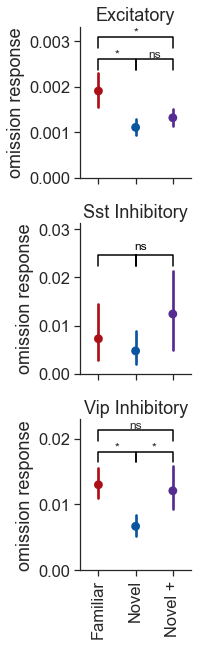

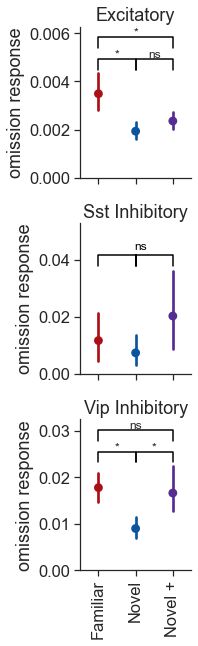

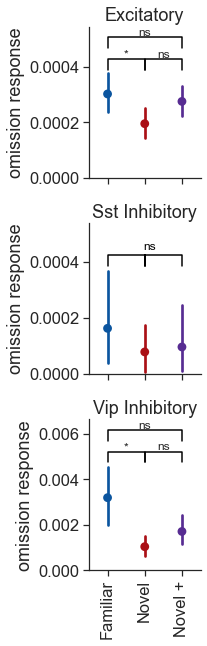

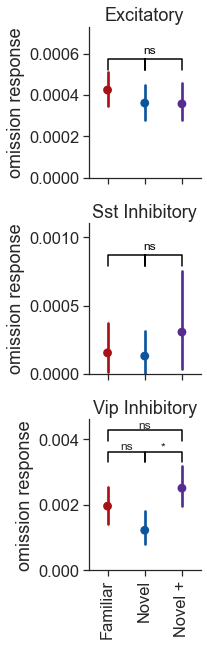

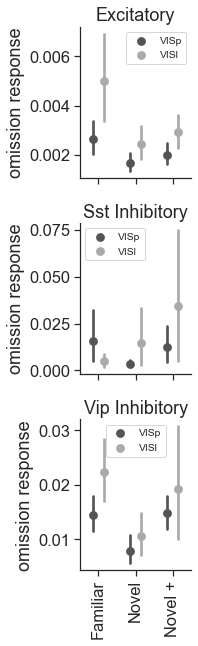

...

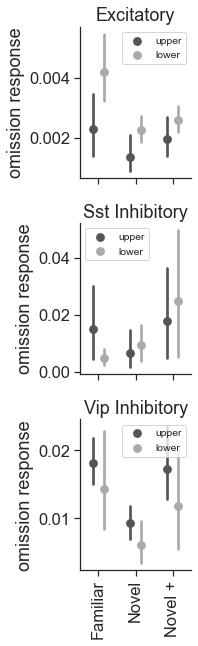

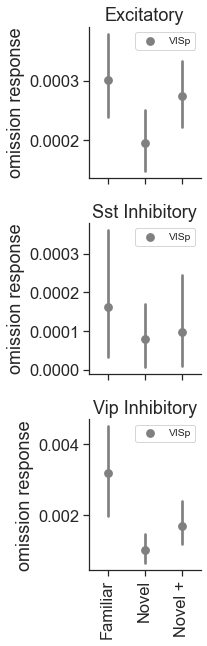

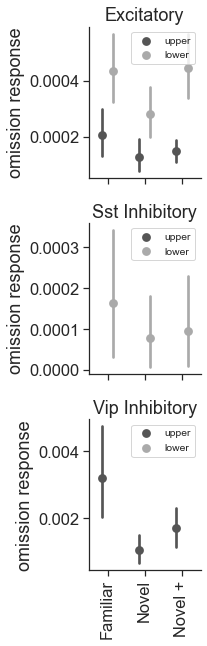

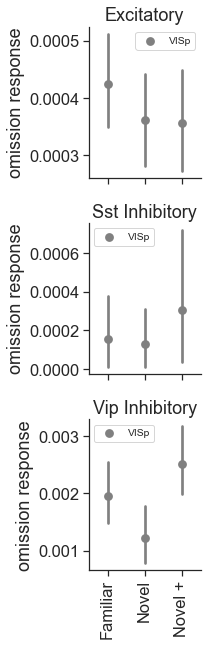

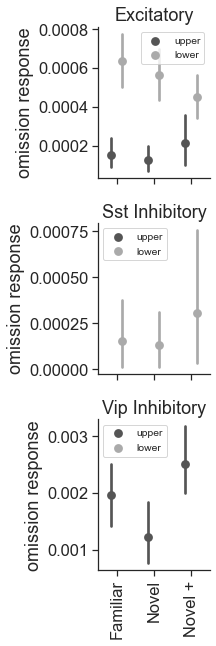

In [103]:
metric = 'omission_response'
ylabel = 'omission response'
ylabel = 'event magnitude'
event_type = 'omissions'

ylims = None #(-0.001, 0.025)

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel='omission response', ylims=ylims, add_zero_line=False, save_dir=save_dir)

### reliability 

please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


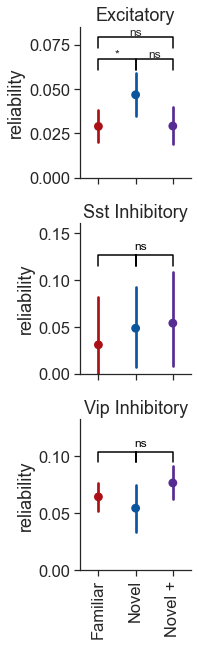

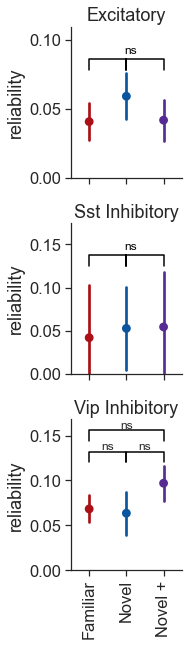

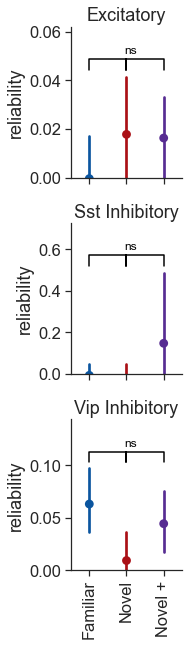

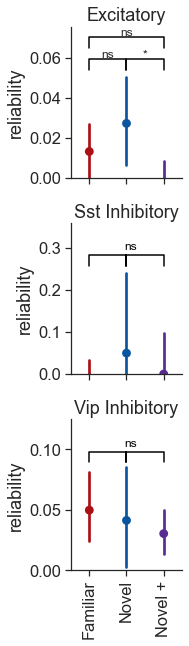

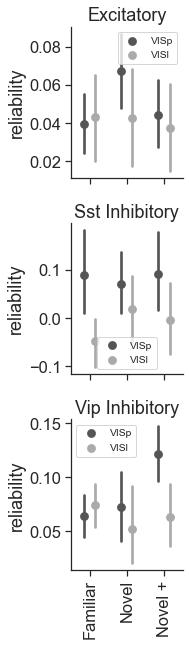

...

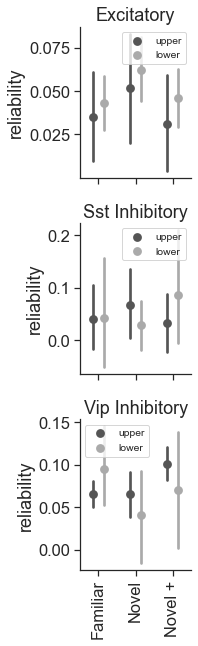

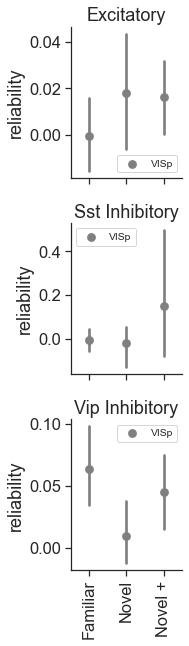

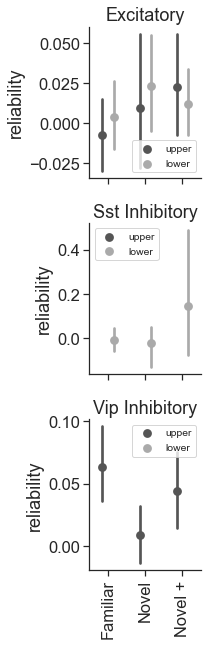

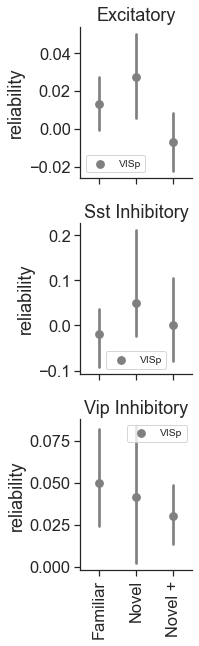

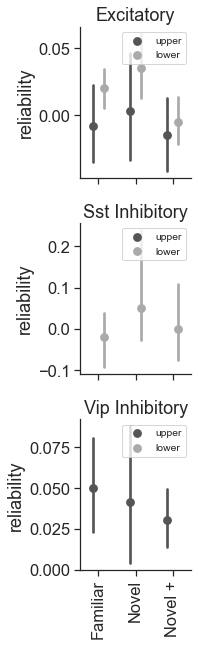

In [104]:
metric = 'reliability'
ylabel = 'reliability'

ylims = None

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims
saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
please provide ylims


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


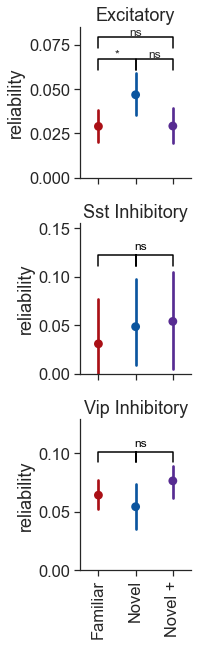

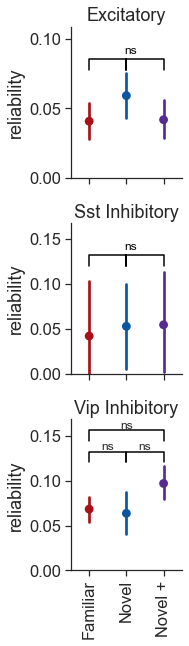

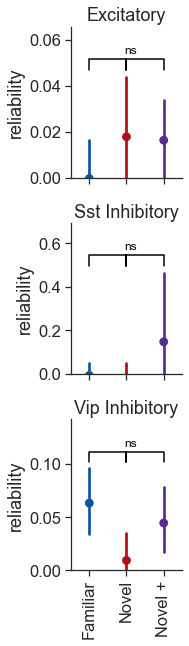

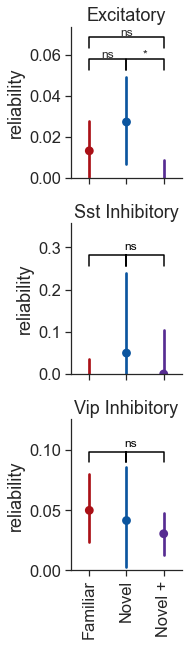

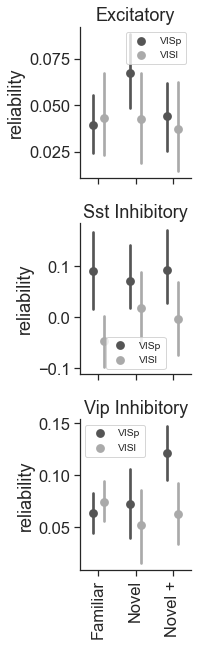

...

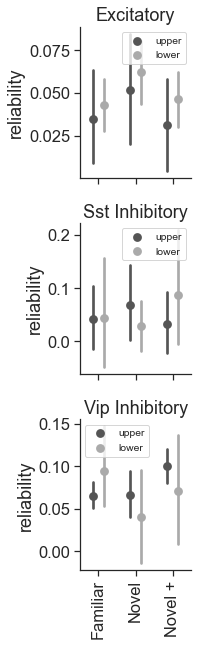

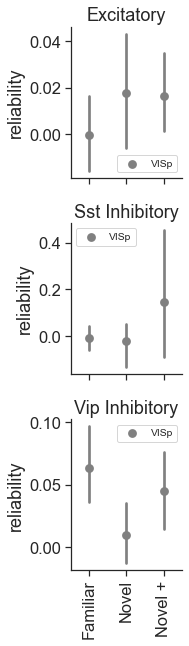

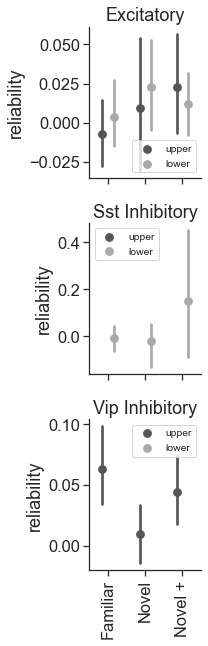

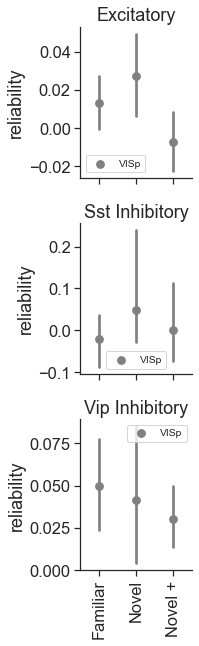

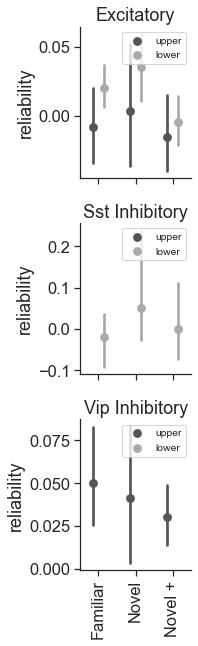

In [105]:
metric = 'reliability'
ylabel = 'reliability'

ylims = None

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### running modulation

saving_stats
saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats


C:\Users\marinag\Anaconda3\envs\visual_behavior_sdk\lib\site-packages\seaborn\algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


saving_stats
saving_stats


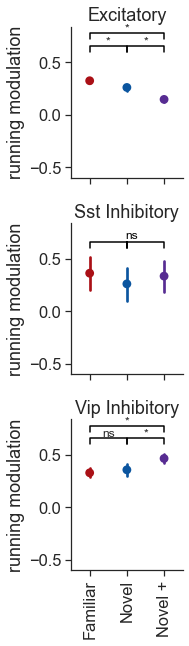

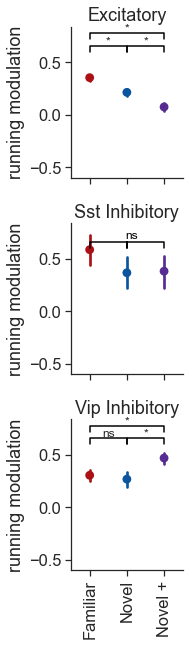

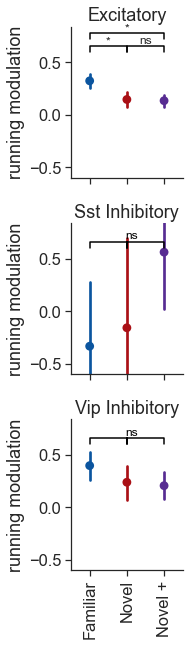

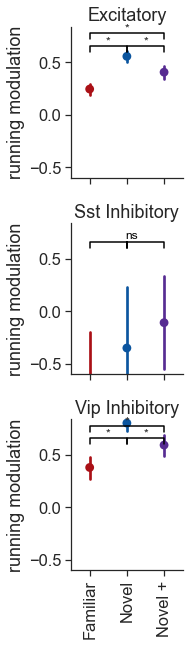

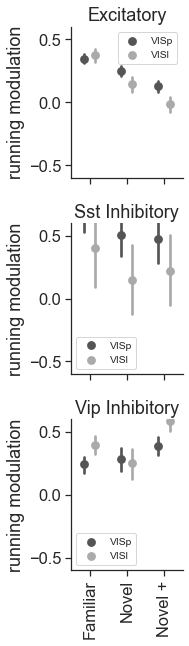

...

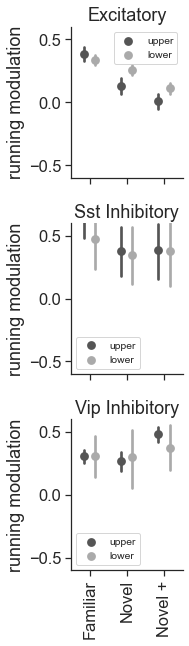

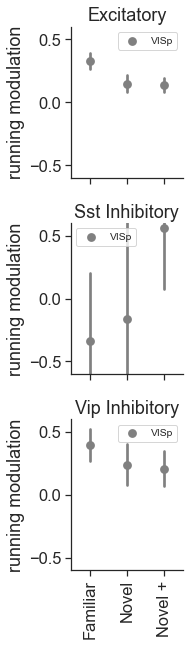

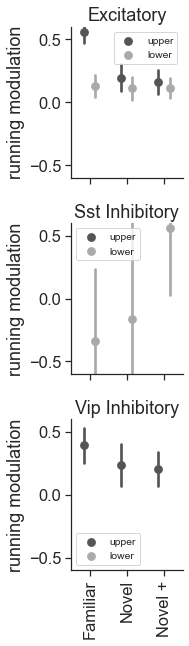

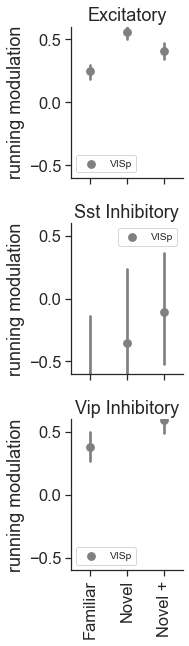

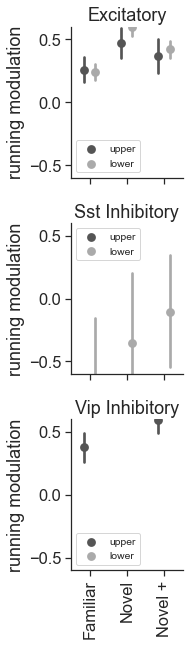

In [106]:
metric = 'running_modulation_index'
ylabel = 'running modulation'
event_type = 'omissions'

ylims = (-0.6, 0.6)

metrics_table = omission_metrics_table.copy()

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, add_zero_line=False, save_dir=save_dir)

### omission modulation by experience

402 experiments in metric_data after merging with cells_table


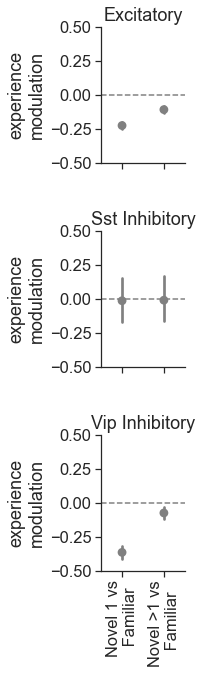

In [107]:
metric = 'omission_response'
event_type = 'omissions'

metric_data = cm.compute_experience_modulation_index(omission_metrics_table, metric, cells_table)
metric_data = metric_data.drop_duplicates(subset='cell_specimen_id')

ppf.plot_experience_modulation_index(metric_data, event_type, save_dir=None)


## Behavior

### running speed

### changes

In [116]:
# params for stim response df creation
event_type = 'all'
# data_type = 'running_speed'

interpolate = False
output_sampling_rate = None

# params for mean response df creation
conditions = ['ophys_experiment_id', 'is_change']

inclusion_criteria = 'platform_experiments'

running_speed_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

running_speed_mdf = loading.get_multi_session_df_for_conditions('running_speed', event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

running_speed_mdf = running_speed_mdf[running_speed_mdf.is_change==True]
running_speed_mdf = running_speed_mdf.drop_duplicates(subset='behavior_session_id')
running_speed_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in running_speed_mdf.experience_level.values]



loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\original_frame_rate
there are 1885 experiments in the full multi_session_df
there are 1884 experiments after filtering for inclusion criteria -  platform_experiments


In [121]:
running_speed_mdf = running_speed_mdf[running_speed_mdf.behavior_session_id.isin(experiment_table.behavior_session_id.unique())]
print(len(running_speed_mdf))

202


array([<AxesSubplot:title={'center':'Familiar'}, xlabel='time after change (s)', ylabel='running speed\n(cm/s)'>,
       <AxesSubplot:title={'center':'Novel'}, xlabel='time after change (s)'>,
       <AxesSubplot:title={'center':'Novel +'}, xlabel='time after change (s)'>],
      dtype=object)

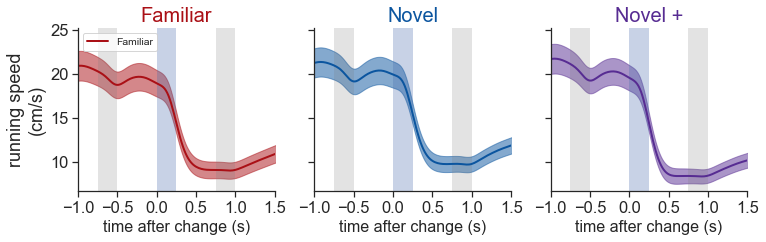

In [122]:
df = running_speed_mdf.copy()
xlim_seconds=[-1, 1.5]

ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
                                                              ylabel='running speed\n(cm/s)',
                                                              data_type='running_speed', event_type='changes', suffix=running_speed_suffix,
                                                               save_dir=save_dir, folder=folder, ax=None)


                                               
# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                               ylabel='running speed\n(cm/s)',
#                                                               data_type='running_speed', event_type='changes', suffix=running_speed_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in running_speed_mdf.project_code.unique():
    
#     df = running_speed_mdf[running_speed_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='running speed\n(cm/s)',
#                                                                   data_type='running_speed', event_type='changes',
#                                                                   suffix=running_speed_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

In [ ]:
# df = running_speed_mdf.copy()
# xlim_seconds=[-1, 1.5]

# axes_column = 'cell_type'
# hue_column = 'experience_level'
# palette = utils.get_experience_level_colors()
# xlim_seconds=[-1., 1.5]
# # xlim_seconds=[-1, 0.75]

# suffix = '_omissions_overlay_'+project_code+'_matched_to_Scientifica'

# ax = ppf.plot_population_averages_for_conditions(df, 'running_speed', 'changes',
#                                                         axes_column, hue_column, horizontal=True,
#                                                         xlim_seconds=xlim_seconds, interval_sec=0.5,
#                                                         palette=palette, ax=None, title=None, suptitle=None,
#                                                         save_dir=save_dir, folder=folder, suffix=suffix)


C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:816: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  x='experience_level', y=metric, palette=colors, ax=ax)


saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


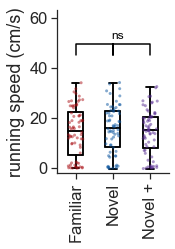

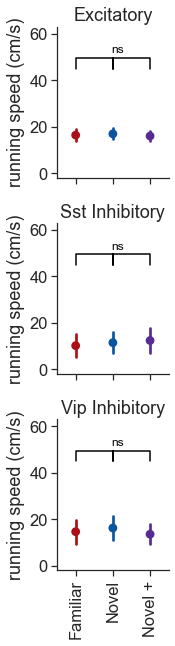

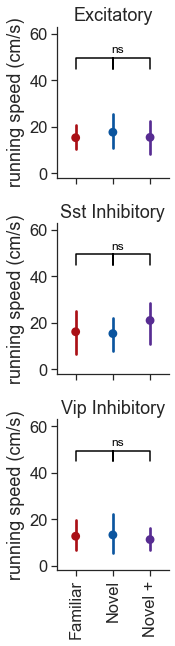

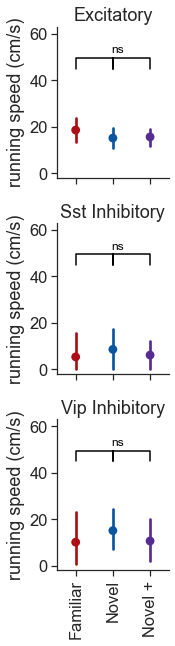

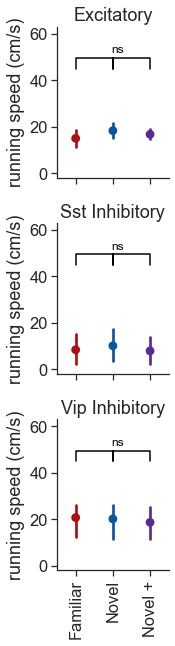

In [135]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'running speed (cm/s)'
event_type = 'running_speed_changes'

ylims = (-2, 45)

metrics_table = running_speed_mdf.copy()

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, 
                                            stripplot=True, add_zero_line=False, save_dir=save_dir)

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, save_dir=save_dir)

### omissions

In [124]:
# params for stim response df creation
event_type = 'all'
data_type = 'running_speed'

interpolate = False
output_sampling_rate = None

# params for mean response df creation
conditions = ['ophys_experiment_id', 'omitted']


running_speed_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

running_speed_omission_mdf = loading.get_multi_session_df_for_conditions('running_speed', event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

running_speed_omission_mdf = running_speed_omission_mdf[running_speed_omission_mdf.omitted==True]
running_speed_omission_mdf = running_speed_omission_mdf.drop_duplicates(subset='behavior_session_id')
running_speed_omission_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in running_speed_omission_mdf.experience_level.values]

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\original_frame_rate
there are 1885 experiments in the full multi_session_df
there are 1884 experiments after filtering for inclusion criteria -  platform_experiments


In [137]:
running_speed_omission_mdf = running_speed_omission_mdf[running_speed_omission_mdf.behavior_session_id.isin(experiment_table.behavior_session_id.unique())]
print(len(running_speed_omission_mdf))

202


array([<AxesSubplot:title={'center':'Familiar'}, xlabel='time after omission (s)', ylabel='running speed\n(cm/s)'>,
       <AxesSubplot:title={'center':'Novel'}, xlabel='time after omission (s)'>,
       <AxesSubplot:title={'center':'Novel +'}, xlabel='time after omission (s)'>],
      dtype=object)

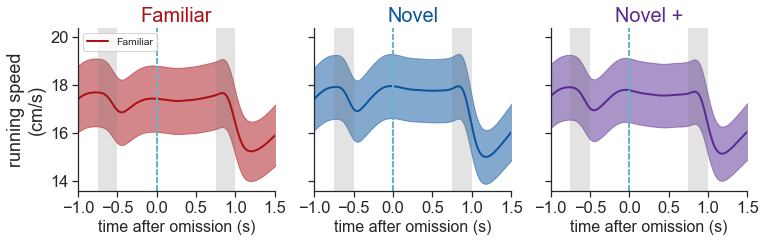

In [126]:
df = running_speed_omission_mdf.copy()
xlim_seconds = [-1, 1.5]

ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
                                                              ylabel='running speed\n(cm/s)',
                                                              data_type='running_speed', event_type='omissions', suffix=running_speed_suffix,
                                                              save_dir=save_dir, folder=folder, ax=None)

# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                               ylabel='running speed\n(cm/s)',
#                                                               data_type='running_speed', event_type='omissions', suffix=running_speed_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in running_speed_mdf.project_code.unique():
    
#     df = running_speed_mdf[running_speed_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='running speed\n(cm/s)',
#                                                                   data_type='running_speed', event_type='omissions',
#                                                                   suffix=running_speed_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:816: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  x='experience_level', y=metric, palette=colors, ax=ax)


saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


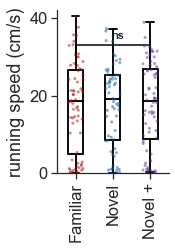

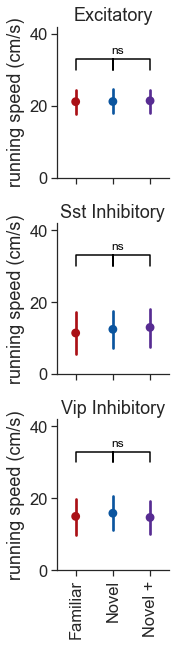

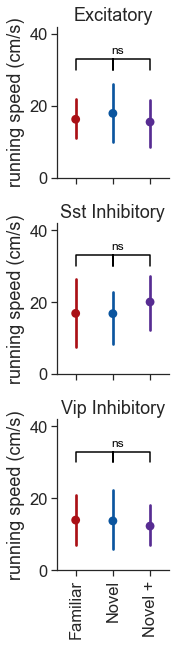

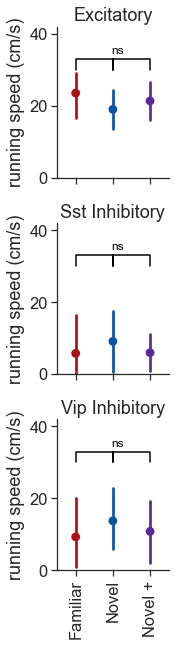

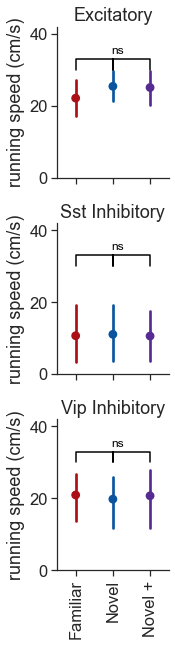

In [138]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'running speed (cm/s)'
event_type = 'running_speed_omissions'

ylims = (0, 30)

metrics_table = running_speed_omission_mdf.copy()

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, 
                                            stripplot=True, add_zero_line=False, save_dir=save_dir)

ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, save_dir=save_dir)

saving_stats


<AxesSubplot:ylabel='running speed (cm/s)'>

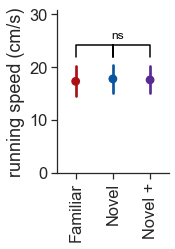

In [128]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'running speed (cm/s)'
event_type = 'running_speed_omissions'

ylims = (0, 22)

metrics_table = running_speed_omission_mdf.copy()

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, 
                                            pointplot=True, add_zero_line=False, save_dir=save_dir)

### pupil width

In [129]:
# params for stim response df creation
event_type = 'all'
# data_type = 'pupil_width'

interpolate = True
output_sampling_rate = 30

# params for mean response df creation
conditions = ['ophys_experiment_id', 'is_change']


pupil_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

pupil_mdf = loading.get_multi_session_df_for_conditions('pupil_width', event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

pupil_mdf = pupil_mdf[pupil_mdf.is_change==True]
pupil_mdf = pupil_mdf.drop_duplicates(subset='behavior_session_id')
pupil_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in pupil_mdf.experience_level.values]

# limit to platform xpts
pupil_mdf = pupil_mdf[pupil_mdf.behavior_session_id.isin(experiment_table.behavior_session_id.unique())]
print(len(pupil_mdf))

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1245 experiments in the full multi_session_df
there are 1244 experiments after filtering for inclusion criteria -  platform_experiments
201


array([<AxesSubplot:title={'center':'Familiar'}, xlabel='time after change (s)', ylabel='pupil width\n(normalized)'>,
       <AxesSubplot:title={'center':'Novel'}, xlabel='time after change (s)'>,
       <AxesSubplot:title={'center':'Novel +'}, xlabel='time after change (s)'>],
      dtype=object)

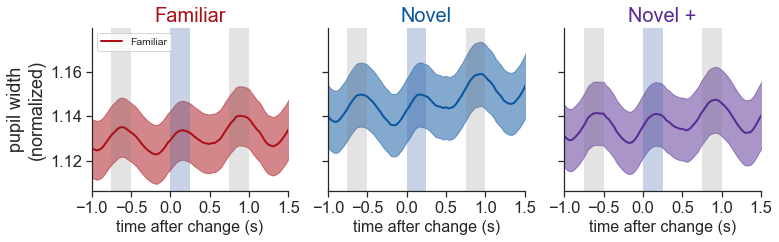

In [130]:
df = pupil_mdf.copy()
xlim_seconds = [-1, 1.5]

ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
                                                              ylabel='pupil width\n(normalized)',
                                                              data_type='pupil_width', event_type='changes', suffix=pupil_suffix,
                                                              save_dir=save_dir, folder=folder, ax=None)

# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                               ylabel='pupil width\n(normalized)',
#                                                               data_type=data_type, event_type='changes', suffix=pupil_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in pupil_mdf.project_code.unique():
    
#     df = pupil_mdf[pupil_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to change\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='pupil width\n(normalized)',
#                                                                   data_type=data_type, event_type='changes',
#                                                                   suffix=pupil_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:816: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  x='experience_level', y=metric, palette=colors, ax=ax)


saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


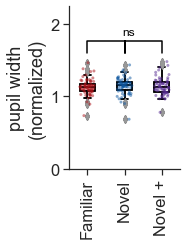

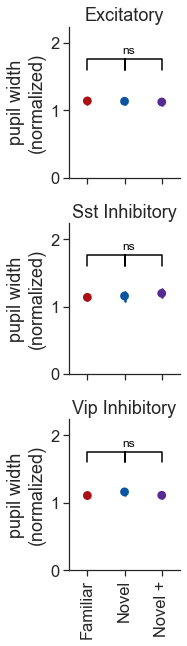

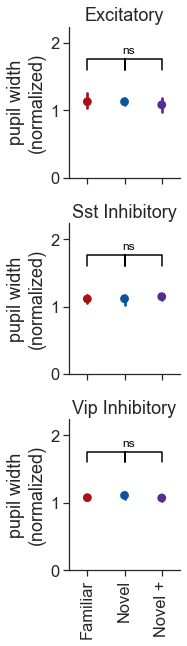

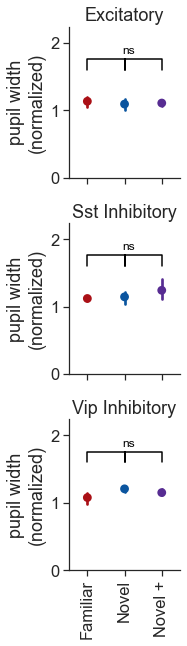

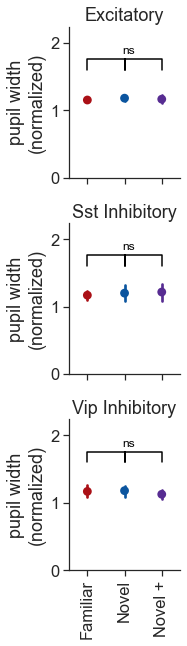

In [139]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'pupil width\n(normalized)'
event_type = 'pupil_width_changes'

ylims = (0, 1.6)

metrics_table = pupil_mdf.copy()

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, 
                                            stripplot=True, add_zero_line=False, save_dir=save_dir)


ppf.plot_metric_distribution_all_conditions(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, save_dir=save_dir)

### omissions

In [132]:
# params for stim response df creation
event_type = 'all'
# data_type = 'pupil_width'

interpolate = True
output_sampling_rate = 30

# params for mean response df creation
conditions = ['ophys_experiment_id', 'omitted']


pupil_suffix = '_'+utils.get_conditions_string(data_type, conditions)+'_'+inclusion_criteria

pupil_omission_mdf = loading.get_multi_session_df_for_conditions('pupil_width', event_type, conditions, inclusion_criteria, 
                                                        interpolate=interpolate, output_sampling_rate=output_sampling_rate, 
                                                         epoch_duration_mins=None)

pupil_omission_mdf = pupil_omission_mdf[pupil_omission_mdf.omitted==True]
pupil_omission_mdf = pupil_omission_mdf.drop_duplicates(subset='behavior_session_id')
pupil_omission_mdf['experience_level'] = [utils.convert_experience_level(experience_level) for experience_level in pupil_omission_mdf.experience_level.values]

# limit to platform xpts
pupil_omission_mdf = pupil_omission_mdf[pupil_omission_mdf.behavior_session_id.isin(experiment_table.behavior_session_id.unique())]
print(len(pupil_omission_mdf))

loading files from \\allen\programs\braintv\workgroups\nc-ophys\visual_behavior\platform_paper_cache\multi_session_mean_response_dfs\interpolate_30Hz
there are 1245 experiments in the full multi_session_df
there are 1244 experiments after filtering for inclusion criteria -  platform_experiments
201


array([<AxesSubplot:title={'center':'Familiar'}, xlabel='time after omission (s)', ylabel='pupil width\n(normalized)'>,
       <AxesSubplot:title={'center':'Novel'}, xlabel='time after omission (s)'>,
       <AxesSubplot:title={'center':'Novel +'}, xlabel='time after omission (s)'>],
      dtype=object)

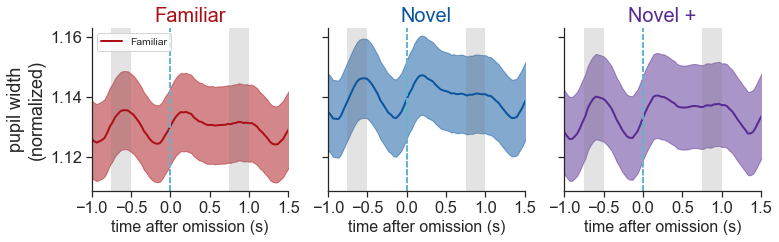

In [133]:
df = pupil_omission_mdf.copy()
xlim_seconds = [-1, 1.5]

ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
                                                              ylabel='pupil width\n(normalized)',
                                                              data_type=data_type, event_type='omissions', suffix=pupil_suffix,
                                                              save_dir=save_dir, folder=folder, ax=None)

# ppf.plot_population_averages_for_cell_types_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                               ylabel='pupil width\n(normalized)',
#                                                               data_type=data_type, event_type='omissions', suffix=pupil_suffix,
#                                                               save_dir=save_dir, folder=folder, ax=None)

# for project_code in pupil_mdf.project_code.unique():
    
#     df = pupil_mdf[pupil_mdf.project_code==project_code]

#     ppf.plot_population_averages_across_experience(df, xlim_seconds=xlim_seconds, xlabel='time relative to omission\n(seconds)', interval_sec=0.5,
#                                                                   ylabel='pupil width\n(normalized)',
#                                                                   data_type=data_type, event_type='omissions',
#                                                                   suffix=pupil_suffix+'_'+project_code,
#                                                                   save_dir=save_dir, folder=folder, ax=None)

C:\Users\marinag\Documents\Code\visual_behavior_analysis\visual_behavior\visualization\ophys\platform_paper_figures.py:816: FutureWarning: Passing `palette` without assigning `hue` is deprecated.
  x='experience_level', y=metric, palette=colors, ax=ax)


saving_stats
saving_stats
saving_stats
saving_stats
saving_stats


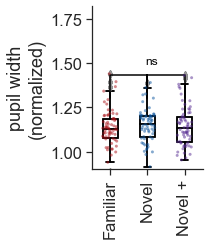

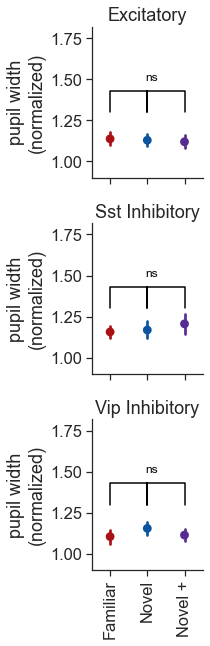

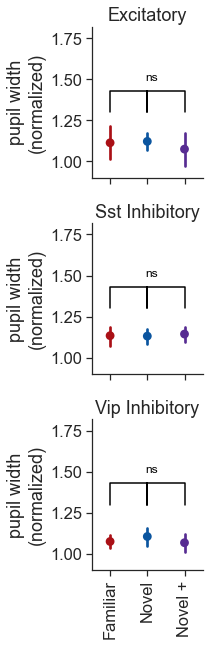

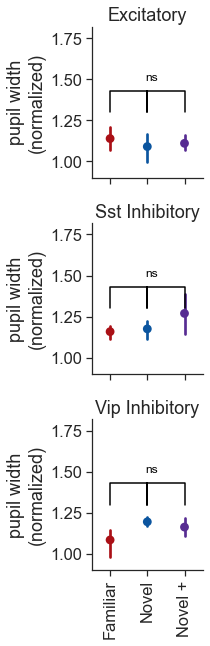

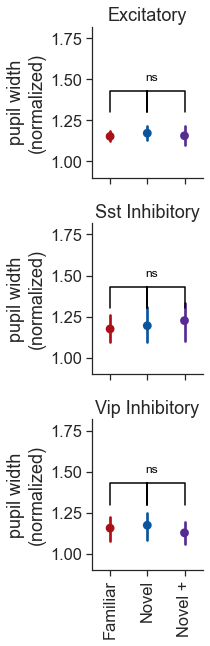

In [140]:
# mean response across experience levels 
metric = 'mean_response'
ylabel = 'pupil width\n(normalized)'
event_type = 'pupil_width_omissions'

ylims = (0.9, 1.3)

metrics_table = pupil_omission_mdf.copy()

ppf.plot_metric_distribution_by_experience_no_cell_type(metrics_table, metric, event_type, ylabel=ylabel, ylims=ylims, 
                                            stripplot=True, add_zero_line=False, save_dir=save_dir)


ppf.plot_metric_distribution_all_conditions(metrics_table, metric, 'pupil_width', ylabel=ylabel, ylims=ylims, 
                                            add_zero_line=False, save_dir=save_dir)